# Maze Runner: AI search algorithms to solve mazes

By **Rohan Rele** (rsr132), **Aakash Raman** (abr103), and **Alex Eng** (ame136)


This project was completed for Professor Wes Cowan's Fall 2019 offering of the CS 520: Intro to Artificial Intelligence course, taught at Rutgers University, New Brunswick.

## Introduction

In this project, we explore various **search algorithms** used to solve problems, like solving mazes. 

Consider a square map of cells, each of which is either open or closed. A **maze game** consists of a user starting from the top-left corner of the map (source) and trying to discover a path to the bottom-right corner of the map (goal).

## Implementation
For this project, we use **Python** and our maze runner code can be found in `MazeRun.py`.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from copy import deepcopy
from IPython.display import Image

from MazeRun import *

### Mazes

Our mazes are represented as square 2D `numpy` arrays. Each entry in such a matrix has one of the following values corresponding to the history of any search algorithm's impact on it:

- -4 for Blocked Cell
- 0 for Empty Cell
- 3 for Visited Cell
- -3 for Visited Cell on a Failed Path

In the case of Bi-Directional BFS (explained below), we also designate the following values for the portion of the algorithm which searches from the goal towards the start:

- 2 for Visited Cell by target-up searcher
- -2 for Visited but Failed Cell by target-up searcher

A maze is constructed via the `generateMaze(dim, p)` function, which initializes a $dim$ by $dim$ square matrix with all zeroes, and randomly designates some cells as blocked with probability $p$, aka the **maze density.**

For example:

In [2]:
mz1 = generateMaze(10, 0.2)
print(mz1)

[[ 0.  0.  0.  0.  0.  0. -4.  0.  0.  0.]
 [ 0.  0.  0. -4.  0.  0.  0.  0.  0.  0.]
 [-4. -4.  0. -4.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0. -4.  0.  0.  0. -4.  0.  0.]
 [ 0.  0.  0. -4.  0. -4.  0. -4.  0.  0.]
 [-4.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0. -4. -4.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0. -4.  0.  0.]
 [ 0. -4.  0.  0.  0.  0.  0.  0. -4.  0.]]


We also use a utility `printMazeHM(maze)` function to visualize the maze via a `seaborn` heatmap.

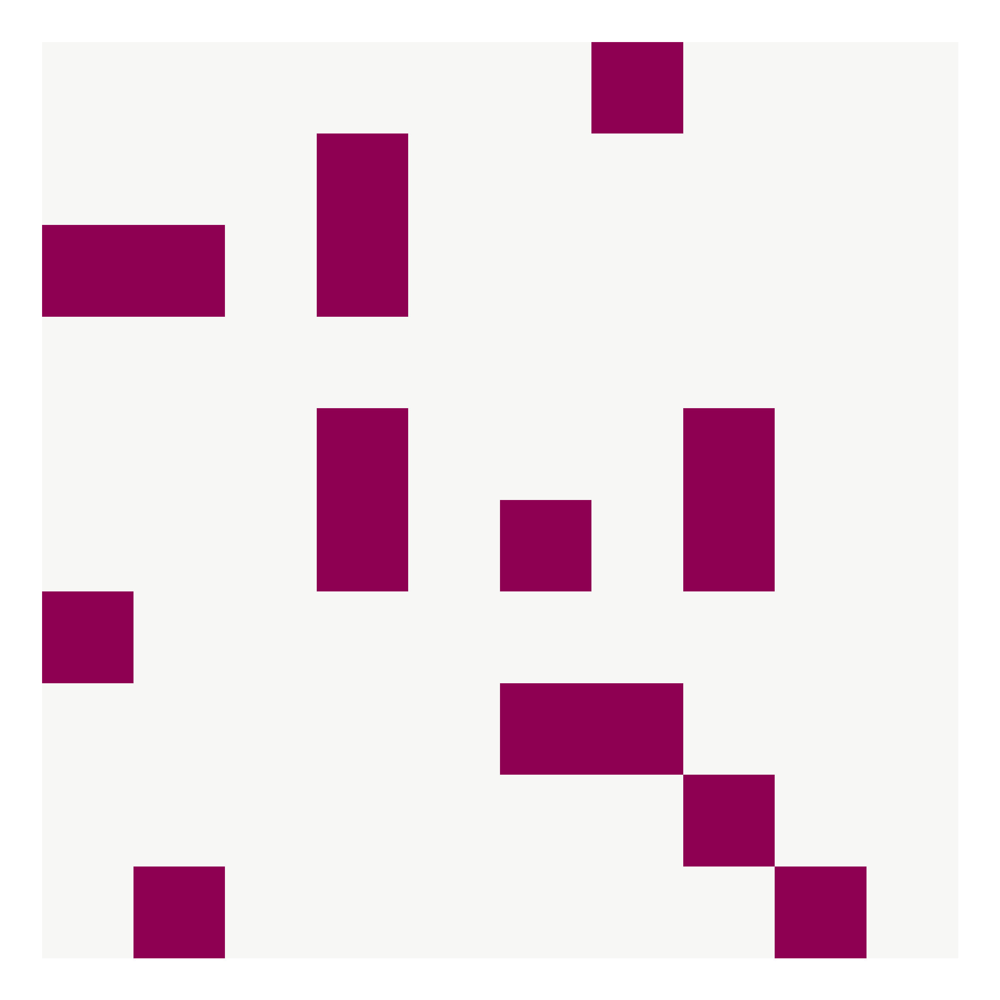

In [3]:
printMazeHM(mz1)

The dark purple cells above are blocked, whereas the white cells are open. The cells will be filled with various values after a search algorithm has been conducted.

### Search Algorithms

We implemented the following 5 search algorithms, which will either solve the maze with a successful path from $S$ to $G$, or return failure.

1. Depth-First Search **(DFS)**
2. Breadth-First Search **(BFS)**
3. **A*** with the heuristic set as the **Euclidean Distance**
4. **A*** with the heuristic set at the **Manhattan Distance**
5. Bi-Directional Breadth-First Search **(BD-BFS)**

All of the above algorithms have been implemented in `MazeRun.py` as functions, and they return the final maze as well as a list of the solved path, if applicable. For more complicated analyses in later sections, they may also return metadata such as maximum fringe size or maximum nodes expanded.

Using the map above with $dim = 10$ and $p = 0.2$, we demonstrate these algorithms below:

#### 1. DFS

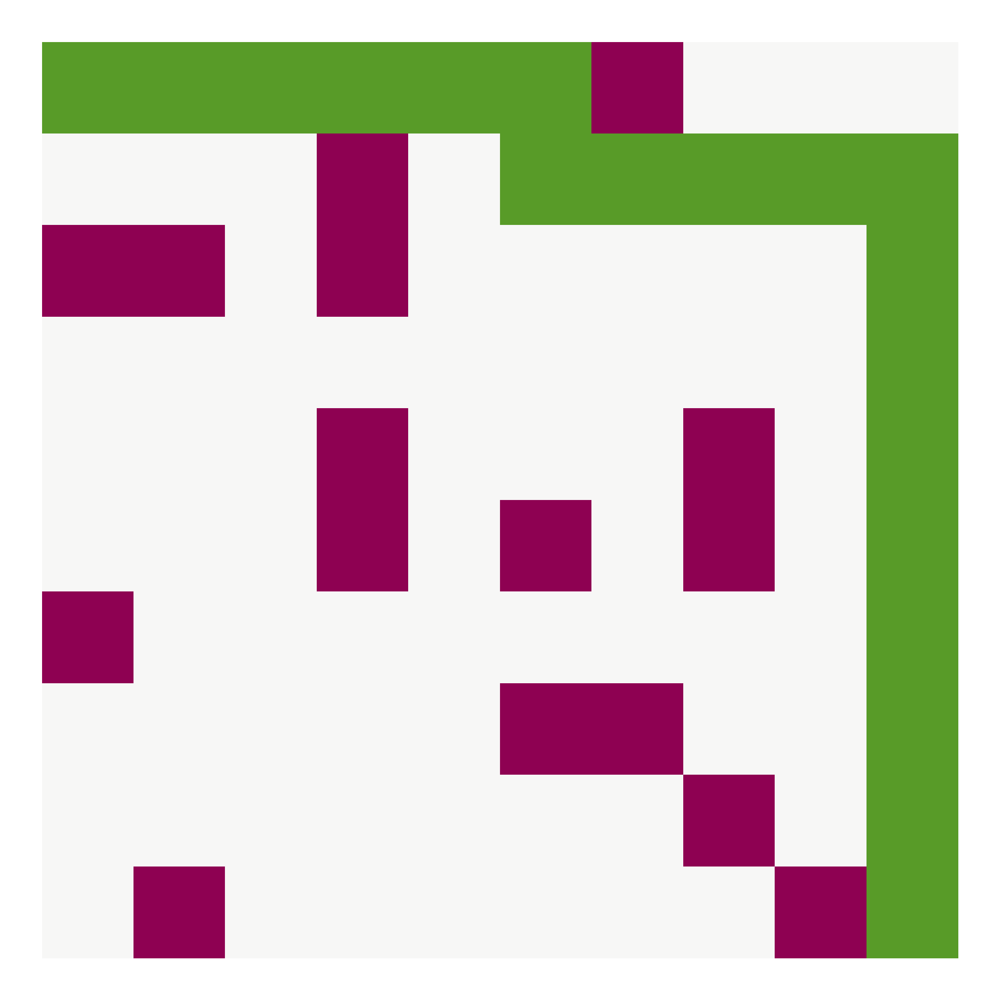

In [4]:
dfs_mz = deepcopy(mz1)
result, path = DFS(dfs_mz)
printMazeHM(result)

Green cells were taken on the correct solution path. Pink cells were visited, but ultimately not on the correct solution path.

#### 2. BFS

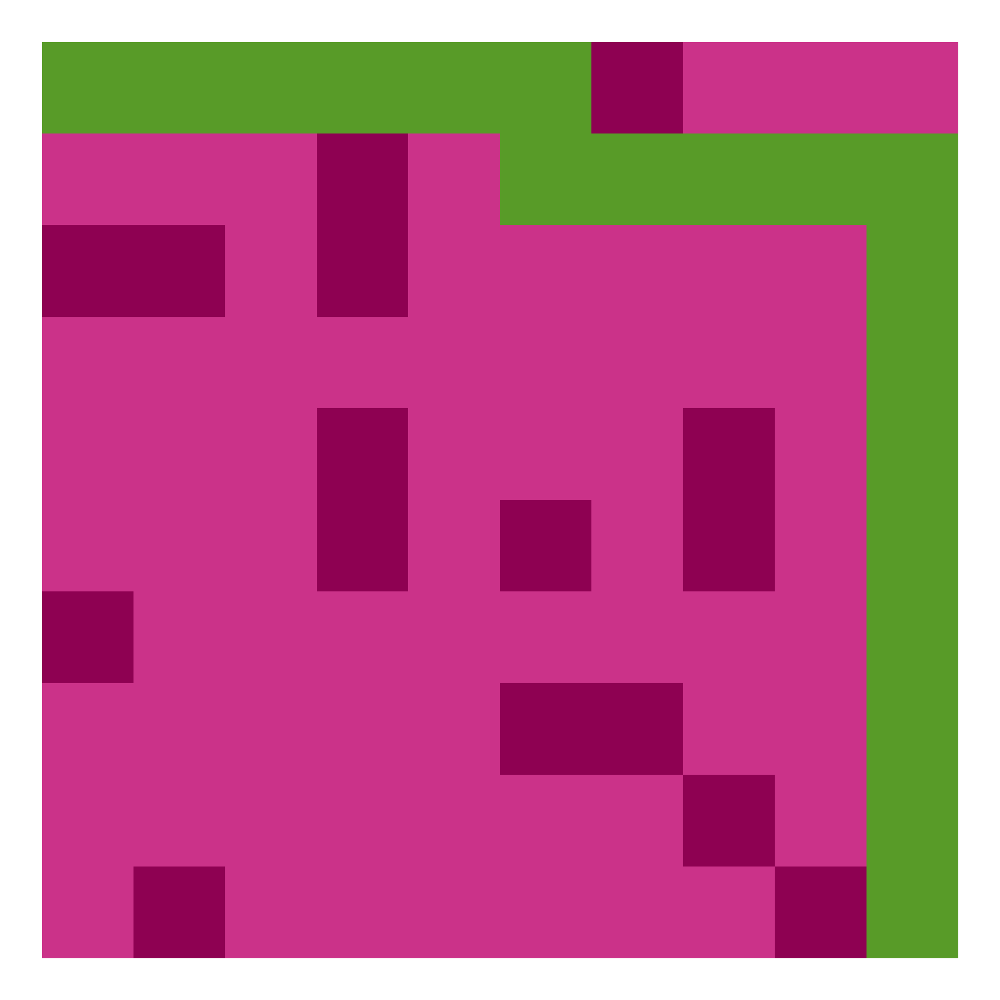

In [5]:
bfs_mz = deepcopy(mz1)
result, path = BFS(bfs_mz)
printMazeHM(result)

#### 3. A*, Euclidean distance heuristic

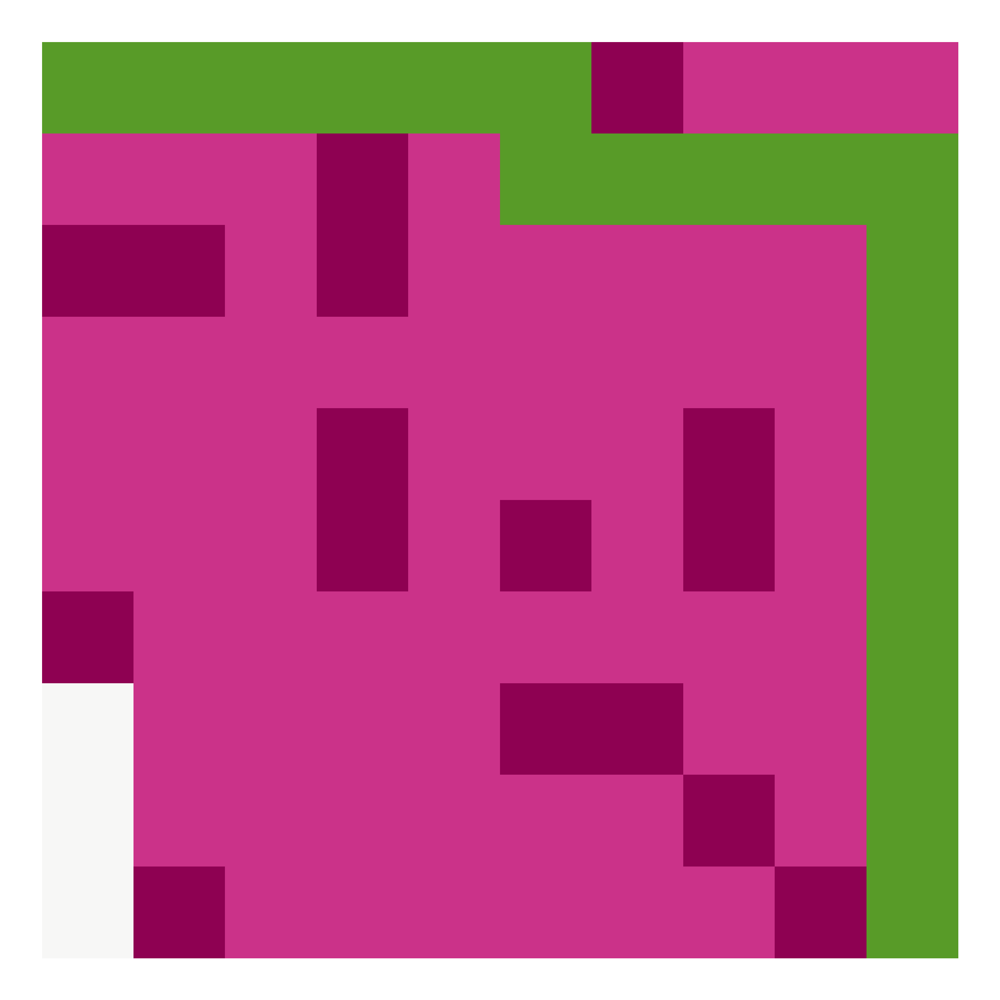

In [6]:
a_star_euclid_mz = deepcopy(mz1)
result, path = A_star(a_star_euclid_mz, dist_euclid)
printMazeHM(result)

#### 4. A*, Manhattan distance heuristic

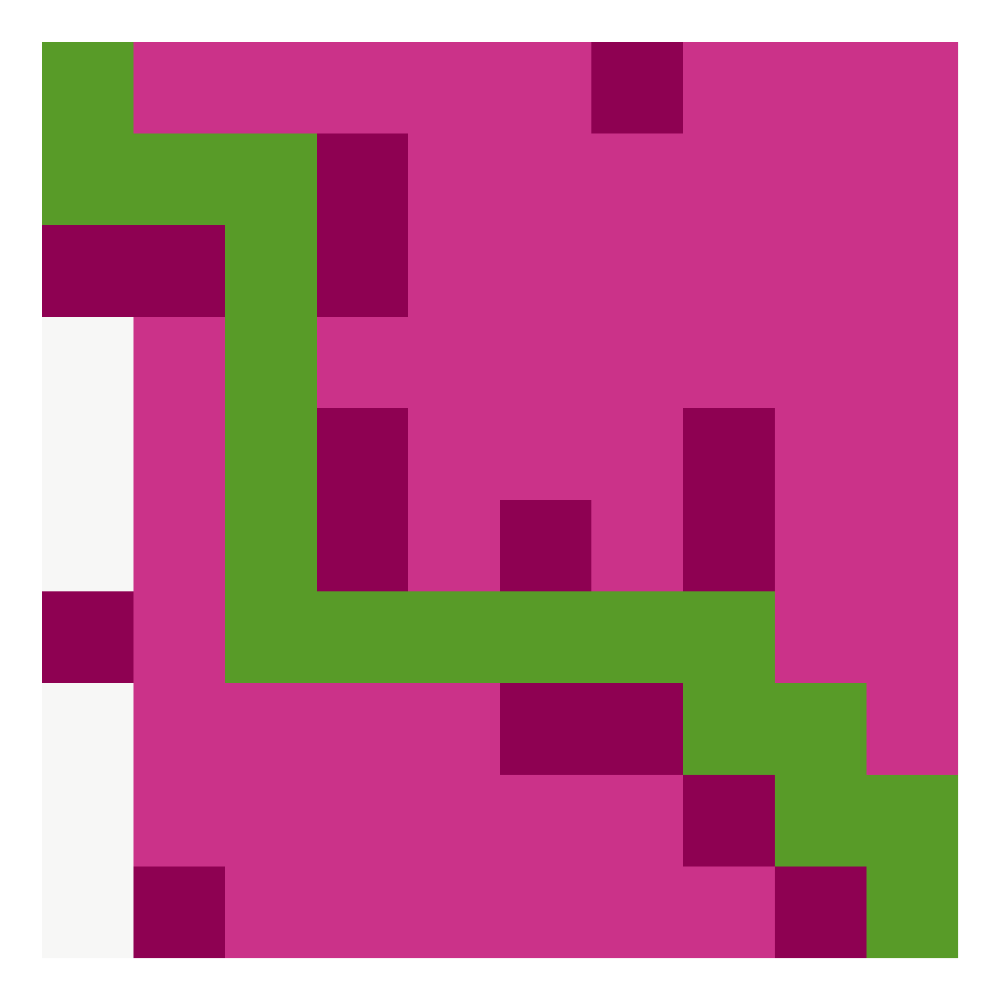

In [7]:
a_star_manhattan_mz = deepcopy(mz1)
result, path = A_star(a_star_manhattan_mz, dist_manhattan)
printMazeHM(result)

#### 5. BD-BFS

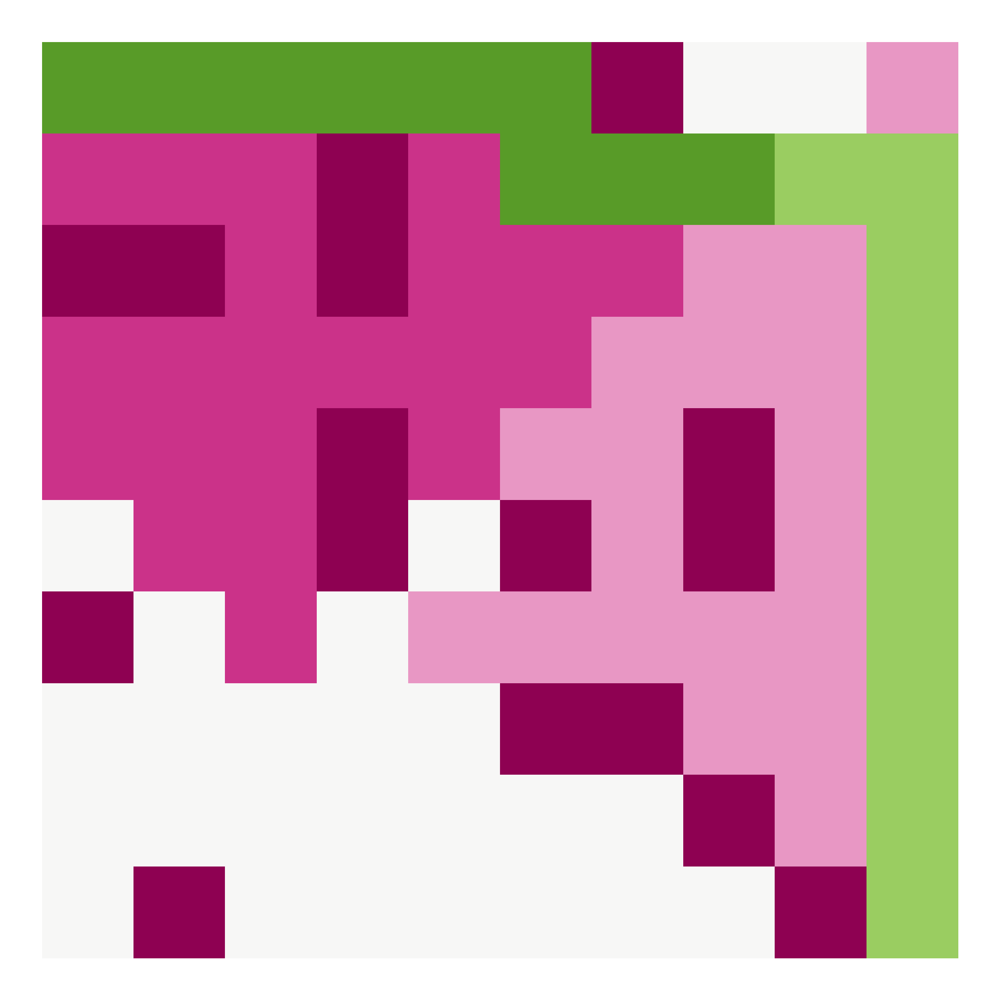

In [8]:
bdbfs_mz = deepcopy(mz1)
result, path = bdBFS(bdbfs_mz)
printMazeHM(result)

For BD-BFS, the search from the source down is colored as usual. But the search from the goal up is colored similarly, with light green cells being along the correct path, and lighter pink cells being visited but not along the correct path.

Note that the union of the dark and light green cells ultimately comprise the final solution path.

## Algorithm Analysis & Comparison

Moving forward, we wish to analyze these algorithms. For this, we use the driver function `algoTrialDriver(dim, wall_probability, algo, num_trials)` to drive our simulations. This function will perform $n$ trials of the selected algorithm, and return the following values:

1. Solvability ratio $p_S \in [0,1]$: proportion of trials which were solved successfully
2. Average runtime per trial, in seconds

**Note:** As runtime is machine-dependent, we provide the specifications for the machine used to conduct trials:

- Apple MacBook Pro (Retina, 13-inch, Early 2015)
- 2.9 GHz Intel Core i5 Processor
- 8 GB 1867 MHz DDR3
- macOS Mojave, version 10.14.5

### Finding a suitable map size

We wish to find a map size ($dim$) that is large enough to produce sufficiently difficult maps but not too large such that our algorithms are no longer runnable (in terms of runtime) for a variety of $p$ values. Again, $p$ is the probability of any given map cell being blocked.

It can be assumed that as $dim$ increases, the difficulty of the map is strictly increasing. Therefore, we seek the maximal $dim$ such that the corresponding map is still solvable in reasonable time. 

We define a reasonable trial time as $t \leq 5$ seconds per trial.

We simulate $n = 50$ trials for each algorithm with $dim \in [25, 400]$ and $p \in \{0.2, 0.4, 0.6, 0.8\}$. Then, we record average total runtime per $n$ $(dim,p)$ trials and graph this average total runtime against $dim$.

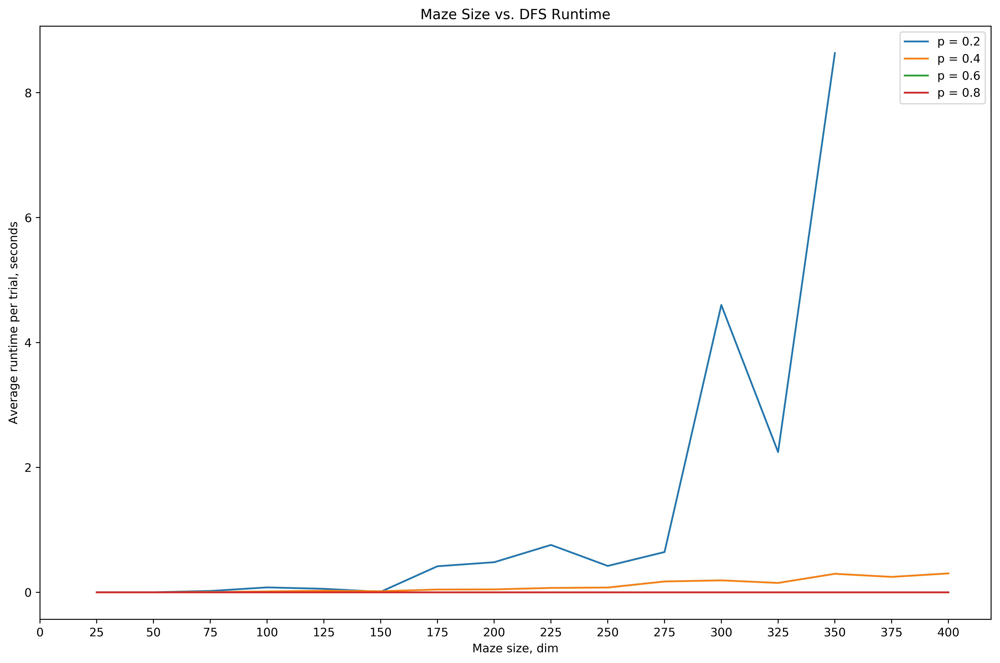

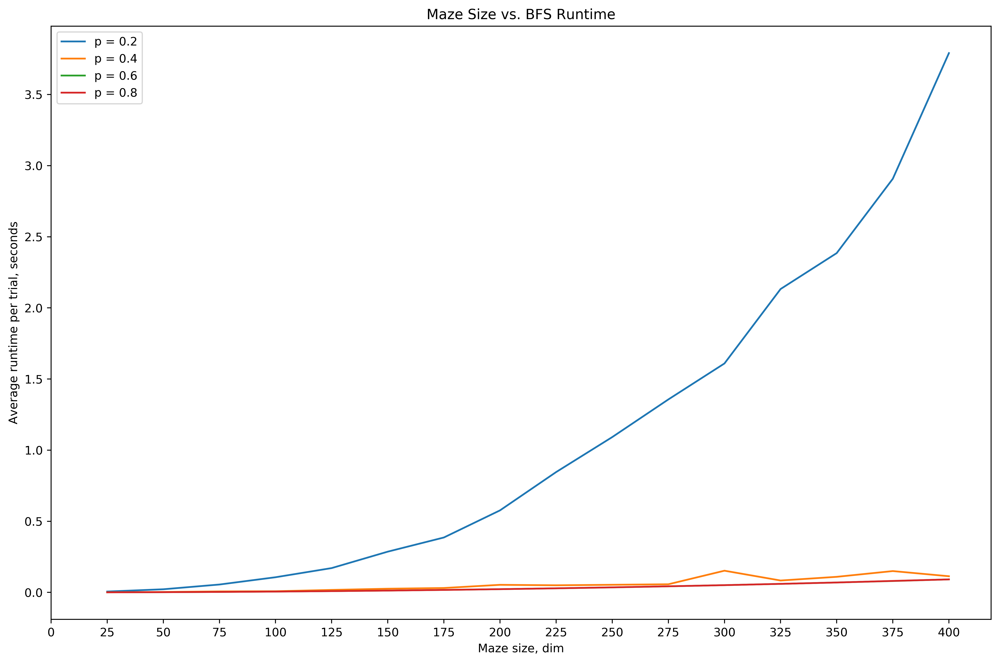

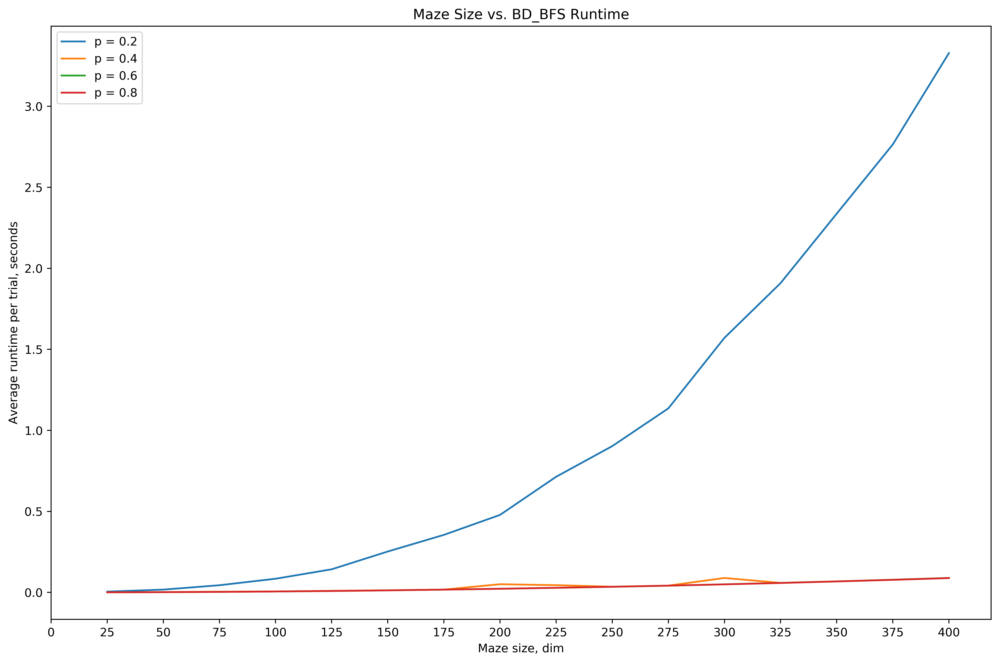

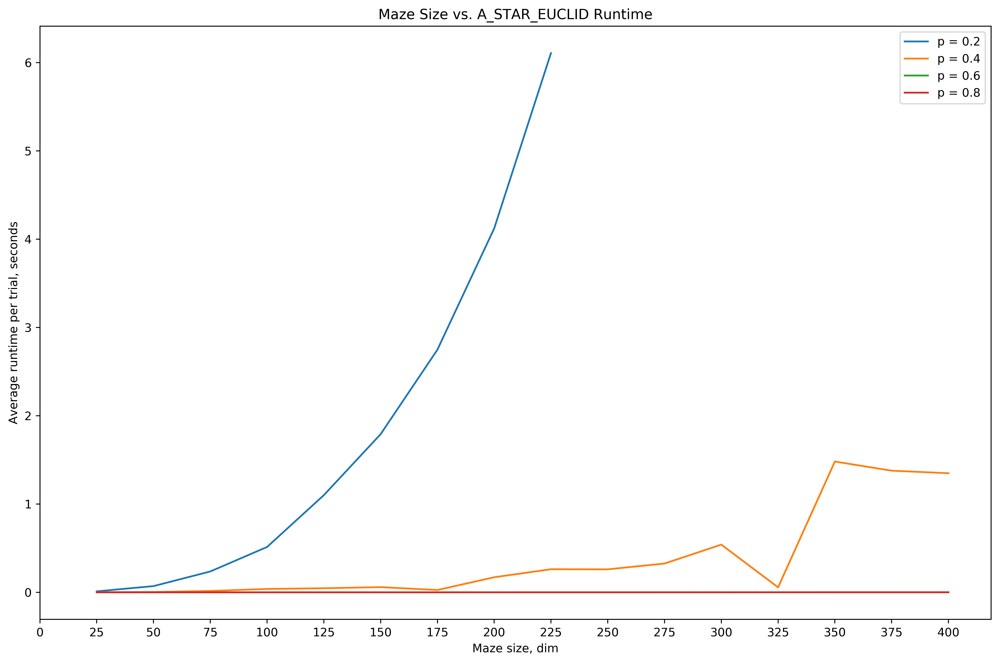

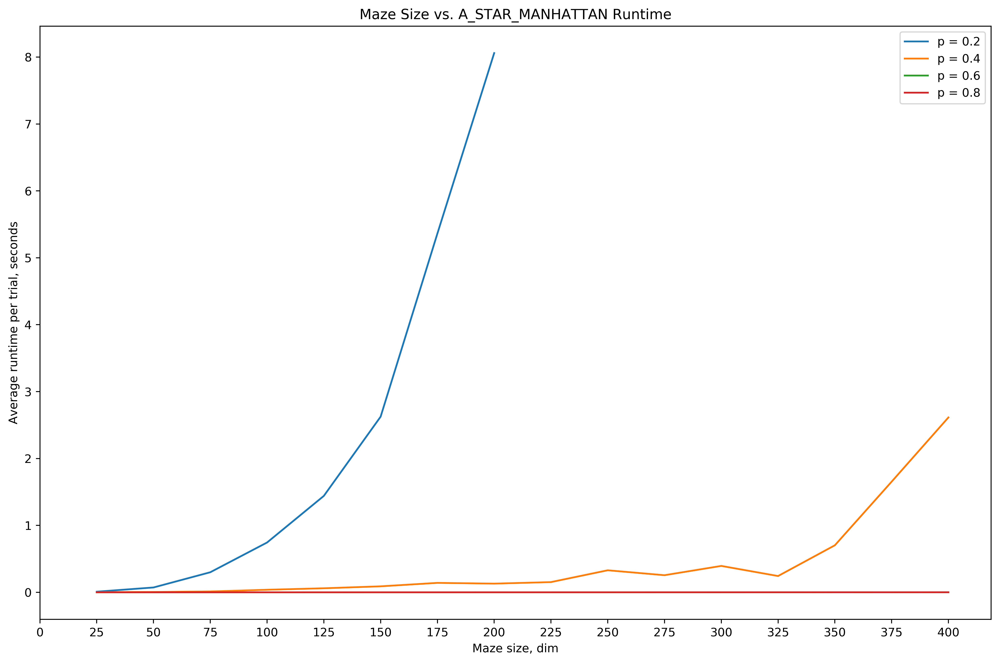

In [9]:
n = 50
p_range = [round(x,2) for x in np.arange(0.2, 1.0, 0.2)]
dim_range = [a for a in range(25, 401, 25)]
algos = ['DFS', 'BFS', 'BD_BFS', 'A_STAR_EUCLID', 'A_STAR_MANHATTAN']
dvr_algos = []

for algo in algos:
    dvr = []
    for p in p_range:
        dvr_row = []
        for dim in dim_range:
            # perform simulation
            solve_ratio, avg_runtime = algoTrialDriver(dim, p, algo, n)
            dvr_row.append(avg_runtime)
            # prevents loop from repeatedly executing longer trials lasting longer than 6s
            if(avg_runtime > 6):
                break
        dvr.append(dvr_row)
    # make a nice DataFrame of it
    dvr_df = pd.DataFrame(dvr)
    dvr_df.columns = ['dim = {}'.format(dim) for dim in dim_range]
    dvr_df.index = ['p = {}'.format(p) for p in p_range]
    # graph dim versus runtime
    plt.figure(figsize=(12,8), dpi=500)
    for row in dvr_df.iterrows():
        plt.plot(dim_range, row[1].values)
    plt.xlabel('Maze size, dim')
    plt.xticks([x for x in range(0,401,25)])
    plt.ylabel('Average runtime per trial, seconds')
    plt.title('Maze Size vs. {} Runtime'.format(algo))
    plt.legend([('p = {}'.format(x)) for x in p_range])
    plt.tight_layout()
    plt.show()
    print('\n')
    # keep track of all the DataFrames
    dvr_algos.append((algo, dvr_df))

It is clear that A* escalates runtime the quickest for increasing $dim$, whereas BD-BFS has a runtime which increases at the slowest rate. Hence, if we are to pick just one $dim$ for all algorithms, we choose the one which considers the slowest algorithm's runtime, i.e. A*'s runtime with either the Euclid or the Manhattan distance heuristic. 

Looking at the graphs for A* - Euclid and Manhattan, we need to decide how to choose $dim$ for various $p$. Notice that for higher $p$, the runtime decreases. This is likely because for higher $p$ the mazes are more likely to be unsolvable, and the search algorithms take less time to fail than to succeed. Accordingly, the worst runtimes shown are with $p = 0.02$. Since $p < 0.2$ generates mazes which are too easy, we seek to find the $dim$ for which, at $p = 0.02$, runtimes are not more than 5 seconds.

According to the data as visualized above, the appropriate $dim$ for which average trial solve time is reasonable at 5 seconds is approximately:

1. DFS: 275
2. BFS: 375
3. BD-BFS: 375
4. A* (Euclid): 175
5. A* (Manhattan): 175

As such, let $dim = 175$, such that in the worst case with $p = 0.02$, the slowest algorithm (A*) will not take longer than ~5 seconds to run on average.

In [2]:
dim = 175

Given this $dim$, we can show the above algorithms solving maps with $p = 0.2$.

In [11]:
mz = generateMaze(dim, 0.2)
printMazeHM(mz)

#### DFS

In [12]:
dfs_mz, dfs_path = DFS(deepcopy(mz))
printMazeHM(dfs_mz)

#### BFS

In [13]:
bfs_mz, bfs_path = BFS(deepcopy(mz))
printMazeHM(bfs_mz)

#### BD-BFS

In [14]:
bdbfs_mz, bdbfs_path = bdBFS(deepcopy(mz))
printMazeHM(bdbfs_mz)

#### A* - Euclidean distance heuristic

In [15]:
aStarEuc_mz, aStarEuc_path = A_star(deepcopy(mz), dist_euclid)
printMazeHM(aStarEuc_mz)

#### A* - Manhattan distance heuristic

In [16]:
aStarMan_mz, aStarMan_path = A_star(deepcopy(mz), dist_manhattan)
printMazeHM(aStarMan_mz)

### Maze density $p$ versus solvability

Fixing the $dim$ from above, we want to analyze the relationship between maze density ($p$) and maze solvability. Ultimately, we want to define some threshold $p_0$ such that for $p < p_0$ most mazes are solvable, but for $p > p_0$, most mazes are not solvable.

To analyze this, we fix $dim$ and simulate $n = 100$ trials for various $p$ values. For each $p$, we define $P_p = \frac{X}{n}$ as the solvability of the maze with density $p$, where $X$ is the number of successes of the $n$ trials. Then, we plot $P_p$ against $p$ to observe the relationship between maze density and solvability. Then, we look for the largest possible $p = p_0$ such that the corresponding $P_{p_0} > 0.5$, i.e. most mazes with $p_0$ are solvable.

Importantly, since we are only concerned with solvability, we may use DFS only, because we are not concerned with finding shortest solutions. Hence, we may exploit the fast runtime of DFS to efficiently observe the targeted phenomena.

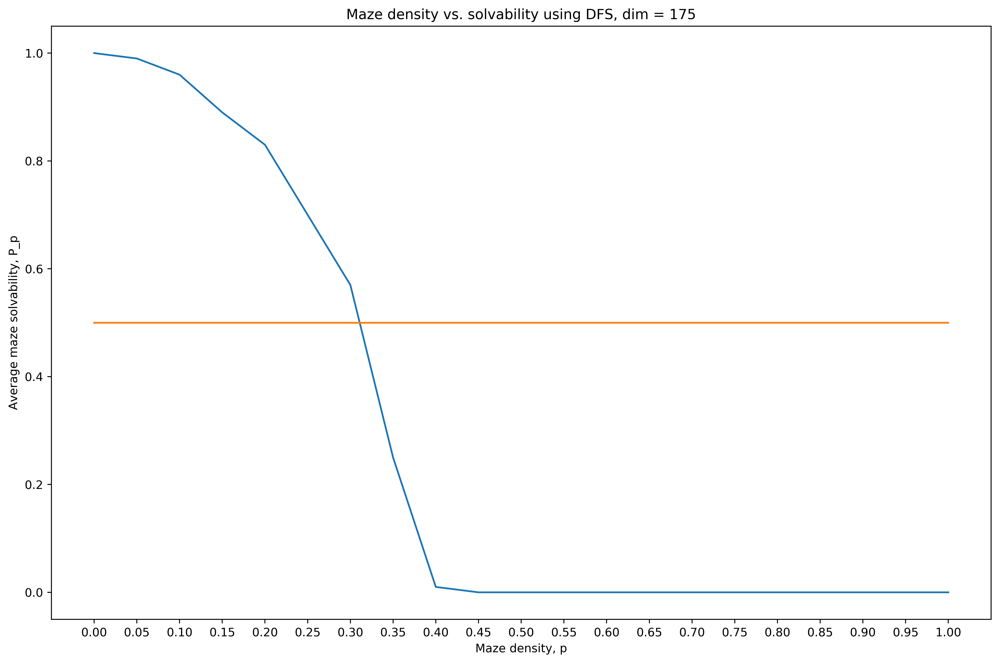

In [17]:
n = 100
p_range = [round(x,2) for x in np.arange(0.0, 1.05, 0.05)]
x_graph_range = [round(x,2) for x in np.arange(0.0, 1.05, 0.05)]
pvs = []

for p in p_range:
    # solve_ratio = P_p in the Markdown cell above
    solve_ratio, avg_runtime = algoTrialDriver(dim, p, 'DFS', n)
    pvs.append(solve_ratio)
# make a nice DataFrame
pvs_df = pd.DataFrame(pvs)
pvs_df.columns = ['P_p']
pvs_df.index = ['p = {}'.format(p) for p in p_range]
# graph P_p vs p
plt.figure(figsize=(12,8), dpi=500)
plt.plot(p_range, pvs_df.values)
plt.plot(x_graph_range, [0.5]*len(x_graph_range))
plt.xlabel('Maze density, p')
plt.xticks(x_graph_range)
plt.ylabel('Average maze solvability, P_p')
plt.title('Maze density vs. solvability using DFS, dim = {}'.format(dim))
plt.tight_layout()
plt.show()

As seen above, the appropriate $p_0$ is somewhere in the interval $[0.30, 0.35]$. We re-run the above analysis in the smaller window $[0.25, 0.35]$ with a more granular $p$ step-scale to ensure we have an accurate estimate for $p_0$.

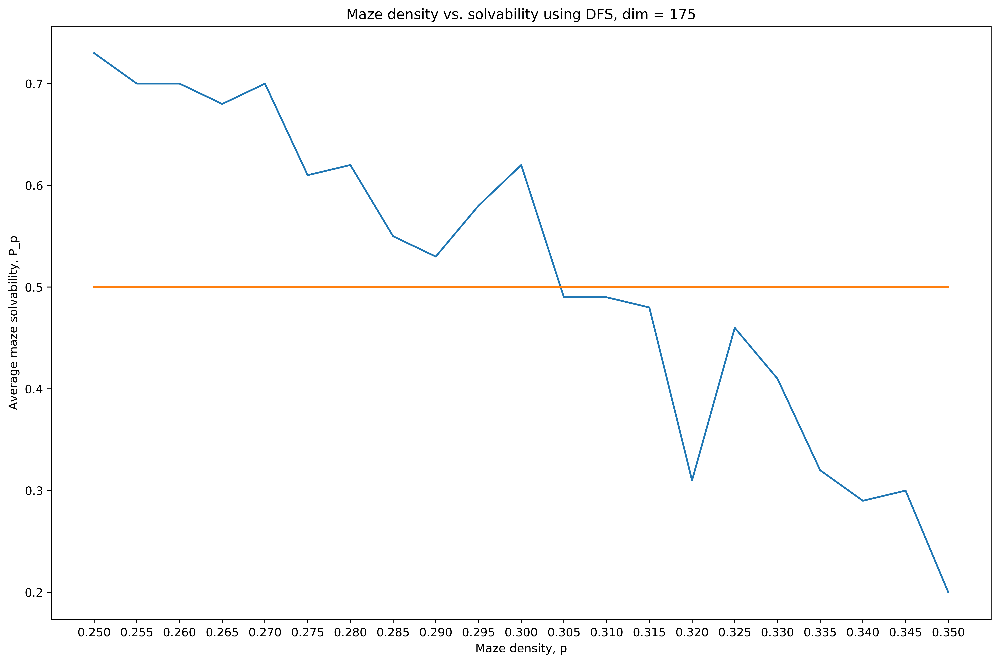

In [18]:
n = 100
p_range = [round(x,3) for x in np.arange(0.25, 0.355, 0.005)]
x_graph_range = [round(x,3) for x in np.arange(0.25, 0.355, 0.005)]
pvs = []

for p in p_range:
    # solve_ratio = P_p in the Markdown cell above
    solve_ratio, avg_runtime = algoTrialDriver(dim, p, 'DFS', n)
    pvs.append(solve_ratio)
# make a nice DataFrame
pvs_df = pd.DataFrame(pvs)
pvs_df.columns = ['P_p']
pvs_df.index = ['p = {}'.format(p) for p in p_range]
# graph P_p vs p
plt.figure(figsize=(12,8), dpi=500)
plt.plot(p_range, pvs_df.values)
plt.plot(x_graph_range, [0.5]*len(x_graph_range))
plt.xlabel('Maze density, p')
plt.xticks(x_graph_range)
plt.ylabel('Average maze solvability, P_p')
plt.title('Maze density vs. solvability using DFS, dim = {}'.format(dim))
plt.tight_layout()
plt.show()

As per the data visualized above, the appropriate $p_0$ is approximately $p_0 = 0.305$.

In [3]:
p_0 = 0.305

### Threshold $p_0$ and maze size

It is also of interest to analyze how the threshold probability $p_0$ selected above varies with maze size. We can simply repeat the above simulations with multiple maze sizes and observe how $p_0$ changes.

For efficiency's sake, we will also just use DFS as above, $n=50$, and $dim \in [10, 200]$. To identify $p_0$ for each $p,dim$, we choose the largest $p$ such that the solvability ratio $P_p >= 0.5$.

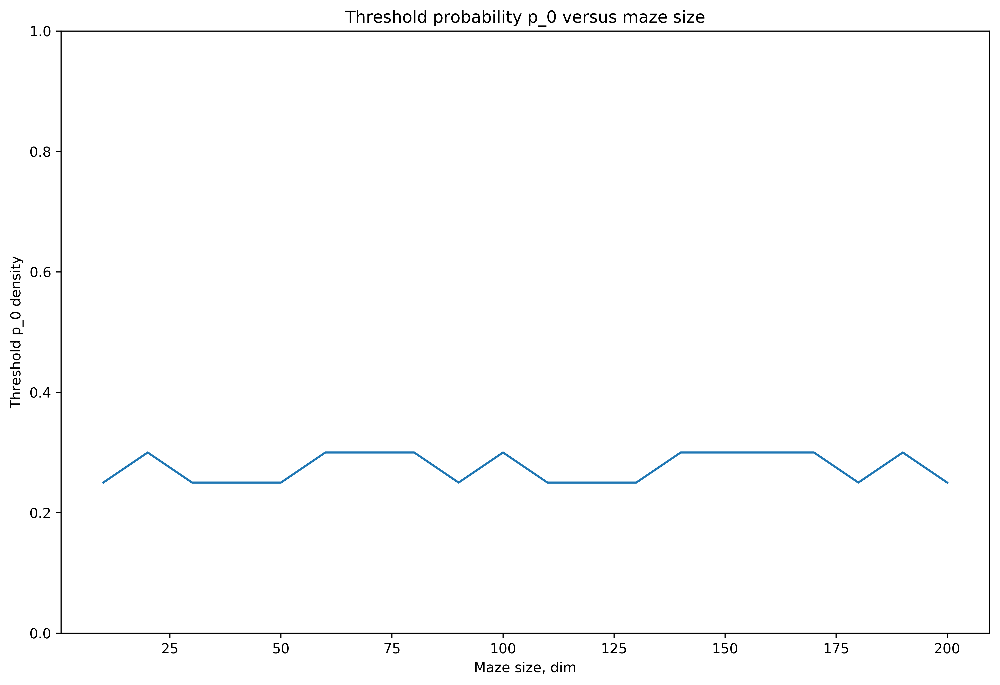

In [22]:
n = 50
p_range = [round(x,2) for x in np.arange(0, 1.05, 0.05)]
dim_range = [x for x in range(10, 201, 10)]
pvs_dims = []
for dim_i in dim_range:
    pvs = []
    for p in p_range:
        # solve_ratio = P_p in the Markdown cell above
        solve_ratio, avg_runtime = algoTrialDriver(dim_i, p, 'DFS', n)
        pvs.append(solve_ratio)
    # make a nice DataFrame
    pvs_df = pd.DataFrame(pvs)
    pvs_df.columns = ['P_p']
    pvs_df.index = [p for p in p_range]
    # find the P_0 for this dim: highest p s.t. solvability >= 0.5
    dim_P_0 = pvs_df[pvs_df['P_p'] >= 0.5].index.values[-1]
    pvs_dims.append(dim_P_0)
plt.figure(figsize=(12,8), dpi=500)
plt.plot(dim_range, pvs_dims)
plt.xlabel('Maze size, dim')
plt.ylabel('Threshold p_0 density')
plt.ylim(0, 1)
plt.title('Threshold probability p_0 versus maze size')
plt.show()

We see that there is not much variation in the threshold $p_0$, with it staying tightly bounded by the interval [0.2, 0.4]. We repeat the above analysis for $p$ in the range $[0.25, 0.35]$ but with more granular step size in order to get a more accurate read on this relationship.

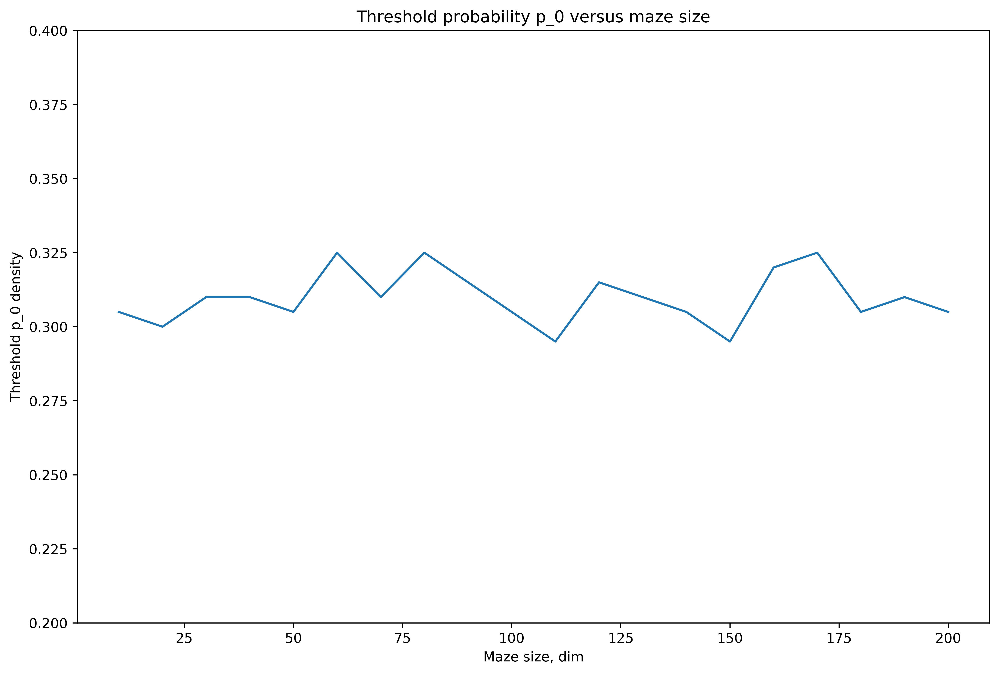

In [24]:
n = 50
p_range = [round(x,3) for x in np.arange(0.25, 0.355, 0.005)]
dim_range = [x for x in range(10, 201, 10)]
pvs_dims = []
for dim_i in dim_range:
    pvs = []
    for p in p_range:
        # solve_ratio = P_p in the Markdown cell above
        solve_ratio, avg_runtime = algoTrialDriver(dim_i, p, 'DFS', n)
        pvs.append(solve_ratio)
    # make a nice DataFrame
    pvs_df = pd.DataFrame(pvs)
    pvs_df.columns = ['P_p']
    pvs_df.index = [p for p in p_range]
    # find the P_0 for this dim: highest p s.t. solvability >= 0.5
    dim_P_0 = pvs_df[pvs_df['P_p'] >= 0.5].index.values[-1]
    pvs_dims.append(dim_P_0)
plt.figure(figsize=(12,8), dpi=500)
plt.plot(dim_range, pvs_dims)
plt.xlabel('Maze size, dim')
plt.ylabel('Threshold p_0 density')
plt.ylim(0.2, 0.4)
plt.title('Threshold probability p_0 versus maze size')
plt.show()

As seen above, the threshold $p_0$ is bounded by $[0.30, 0.33]$, so we restate our earlier observation that despite increasing $dim$, the threshold maze density appears to be approximately $p = 0.30$ for all mazes.

### Maze density $p$ versus shortest path length

Furthermore, given the $p_0$ defined above, we seek to understand the relationship between maze density and how long the shortest paths are for solvable mazes. Therefore, for each algorithm, we run repeated simulations for fixed $dim$ and $p \in [0,p_0]$ as defined in the previous two sections and discard failures. Amongst the successes, we collect data of shortest path length.

Since BFS and BD-BFS are both guaranteed to return the shortest path, they could both find shortest path length in this analysis. But BD-BFS has a lower time and space complexity, i.e. $O(b^{m/2}) \leq O(b^m)$. Therefore, we use BD-BFS to more efficiently compare shortest path lengths across various $p \in [0, p_0]$.

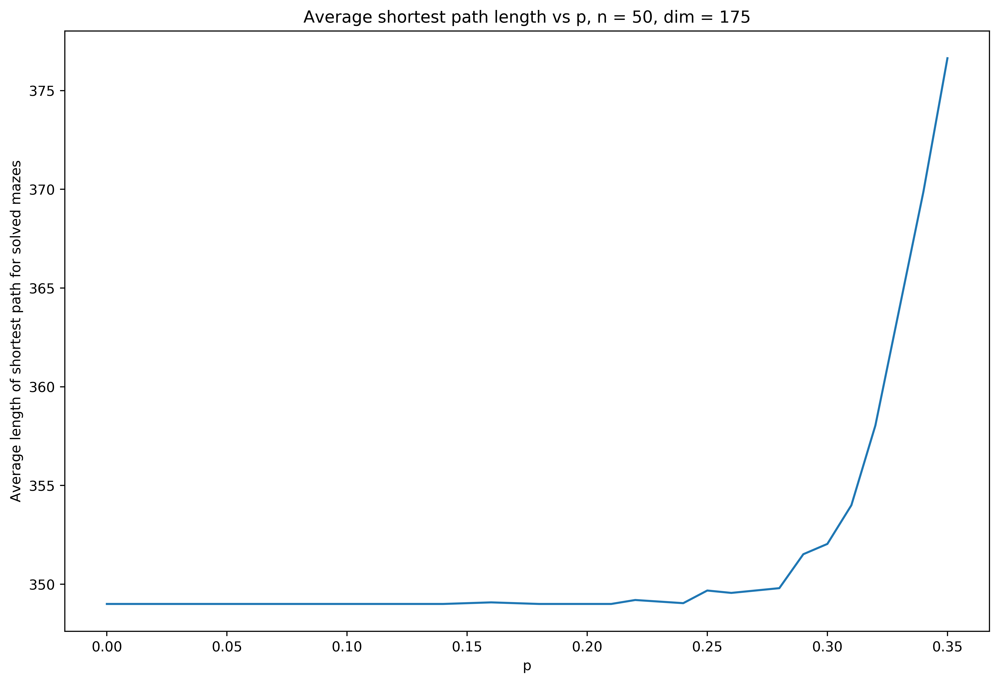

In [25]:
success_sample_size = 50
p_range = [round(p,2) for p in np.arange(0.0, 0.3625, 0.0125)]
pvPath = []
for p in p_range:
    num_successes = 0
    total_path_length = 0
    while(num_successes < success_sample_size):
        result, path = bdBFS(generateMaze(dim,p))
        if path is not None:
            total_path_length += len(path)
            num_successes += 1
    pvPath.append(total_path_length / num_successes)
# make a nice DataFrame
pvPath_df = pd.DataFrame()
pvPath_df['p'] = p_range
pvPath_df['avg_sp_len'] = pvPath
# graph shortest path len vs p
plt.figure(figsize=(12,8), dpi=500)
plt.plot(pvPath_df['p'].values, pvPath_df['avg_sp_len'].values)
plt.xlabel('p')
plt.ylabel('Average length of shortest path for solved mazes')
plt.title('Average shortest path length vs p, n = {}, dim = {}'.format(success_sample_size, dim))
plt.show()

As seen above, the shortest possible path occurs when the algorithm executes on an empty maze $(p=0.00)$. For our fixed $dim = 175$, this path is 350 cells. As $p$ increases towards $p_0=0.301$, the shortest path stays mostly constant until $p > 0.30$, at which point the shortest path grows by around 25 cells to 375 cells long. We see here that **shortest path length is an exponential function of $p$.**

### Comparing A* heuristics

For the A* algorithm, we implemented two heuristics, which we will go into more depth in this section:

1. **Euclidean distance:** straight-line distance between two points $(x_1, y_1),(x_2,y_2)$.

$$d((x_1, y_1),(x_2,y_2)) = \sqrt{(x_1-x_2)^2+(y_1-y_2)^2}$$

2. **Manhattan distance:** distance recovered from only making rectilinear moves between two points $(x_1,y_1),(x_2,y_2)$.

$$d((x_1, y_1),(x_2,y_2)) = |x_1-x_2| + |y_1-y_2|$$

Both of these heuristics are used by the A* algorithm to estimate the total remaining distance from a current cell to the goal cell in a maze. We wish to see which heuristic is more accurate in terms of estimating remaining distance. 

Optimality of a solved maze can be considered in terms of the number of nodes explored along the way to reach the goal state. In cases of failures, both algorithms will exhaust the same number of necessary nodes before terminating, so we only consider successes.

To compare these two heuristics, we simulate a set of successful maze solutions for a range of $p$ values and compare the ratio of the total number of visited nodes to the total number of nodes ($dim^2$), over $n = 50$ trials. We call this the **visitation ratio** of a maze. This includes the path itself. We use the `numVisited(maze)` function which essentially scans a maze and returns the number of visited cells, i.e. all cells that are neither empty nor blocked.

Then, we wish to see if one heuristic uniformly explores fewer total nodes per simulation, over a variety of $p$.

Below, we compare average visitation ratios and runtimes for both A* heuristics.

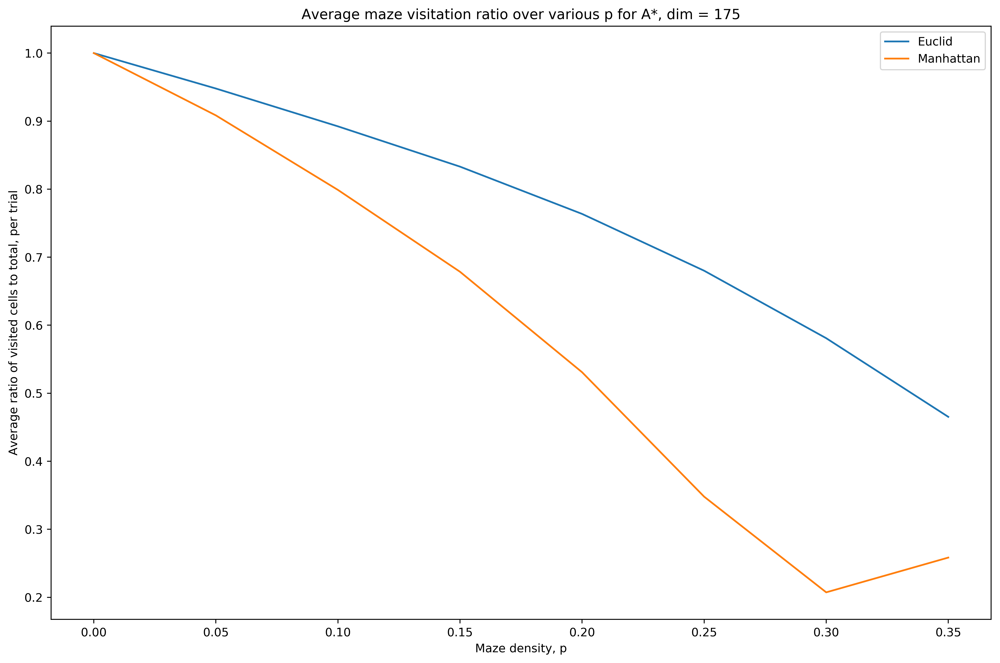

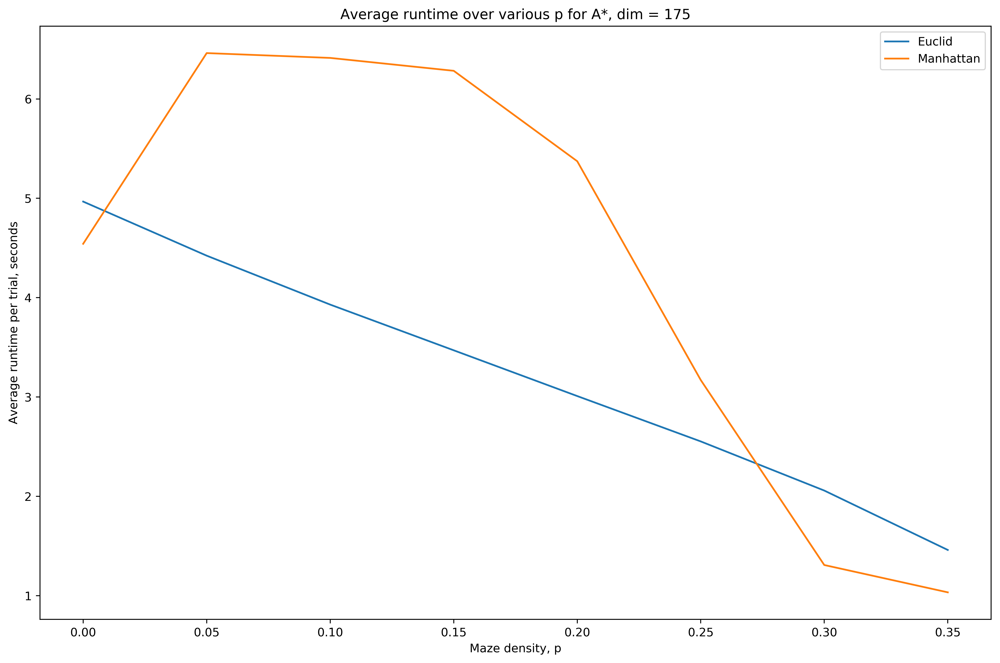

In [28]:
p_range = [round(p,2) for p in np.arange(0, p_0+0.05, 0.05)]
success_sample_size = 50
visits_euc = []
visits_man = []
times_euc = []
times_man = []
for p in p_range:
    euc_avg_visits, euc_avg_time, man_avg_visits, man_avg_time = aStarTrialDriver(dim, p, success_sample_size)
    visits_euc.append(euc_avg_visits)
    visits_man.append(man_avg_visits)
    times_euc.append(euc_avg_time)
    times_man.append(man_avg_time)
# make nice DataFrames of it
visits_df = pd.DataFrame()
visits_df['euc'] = visits_euc
visits_df['man'] = visits_man
visits_df.index = ['p = {}'.format(p) for p in p_range]
times_df = pd.DataFrame()
times_df['euc'] = times_euc
times_df['man'] = times_man
times_df.index = ['p = {}'.format(p) for p in p_range]
# graph visits v p
plt.figure(figsize=(12,8), dpi=500)
plt.plot(p_range, visits_df['euc'].values)
plt.plot(p_range, visits_df['man'].values)
plt.xlabel('Maze density, p')
plt.ylabel('Average ratio of visited cells to total, per trial')
plt.title('Average maze visitation ratio over various p for A*, dim = {}'.format(dim))
plt.legend(['Euclid', 'Manhattan'])
plt.tight_layout()
plt.show()
# graph runtime v p
plt.figure(figsize=(12,8), dpi=500)
plt.plot(p_range, times_df['euc'].values)
plt.plot(p_range, times_df['man'].values)
plt.xlabel('Maze density, p')
plt.ylabel('Average runtime per trial, seconds')
plt.title('Average runtime over various p for A*, dim = {}'.format(dim))
plt.legend(['Euclid', 'Manhattan'])
plt.tight_layout()
plt.show()

As opposed to average visitation ratios and runtimes, we plot, for $p = 0.255, 0.305, 0.355$ the actual visitation ratios and runtimes per trial for 50 trials.

p = 0.255



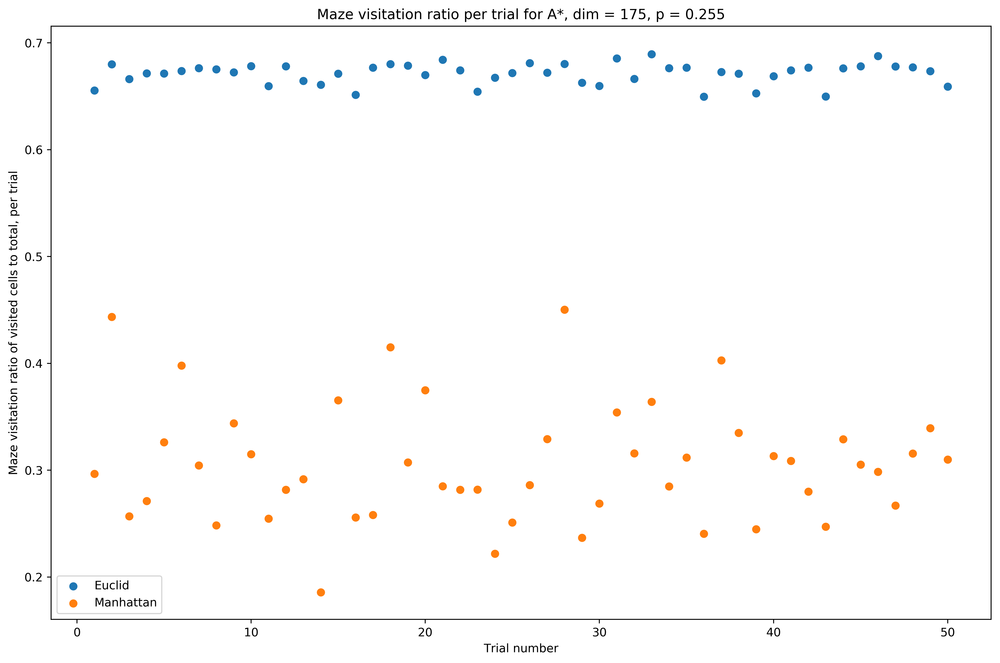

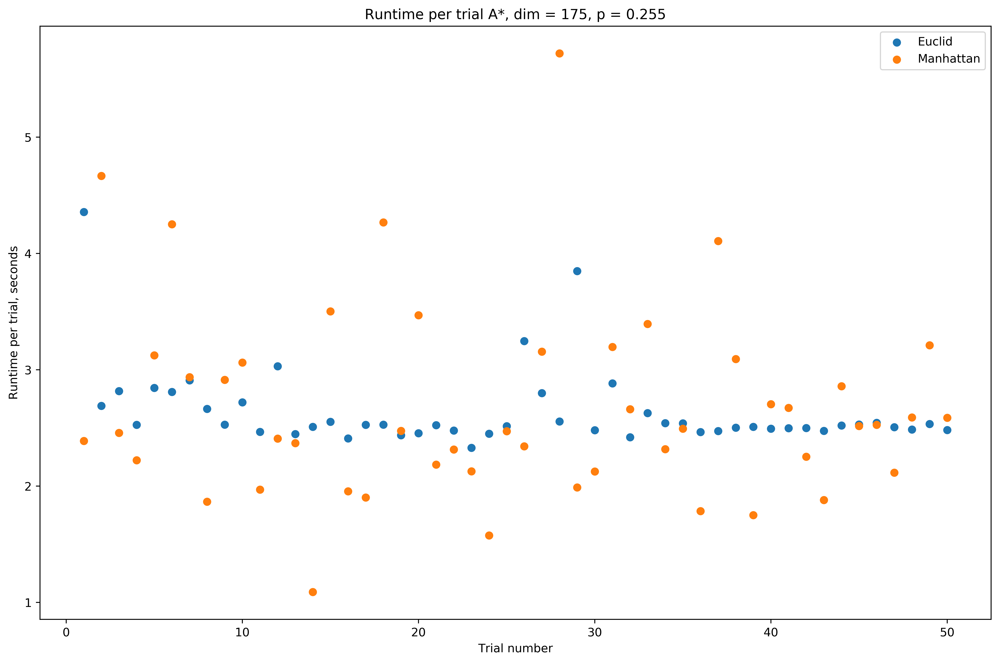

p = 0.305



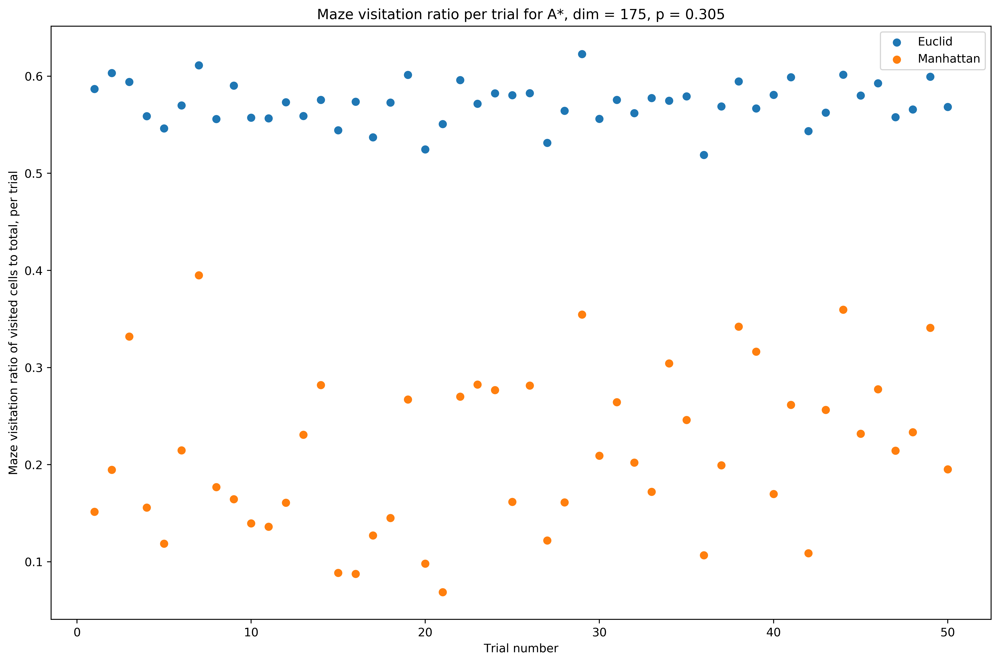

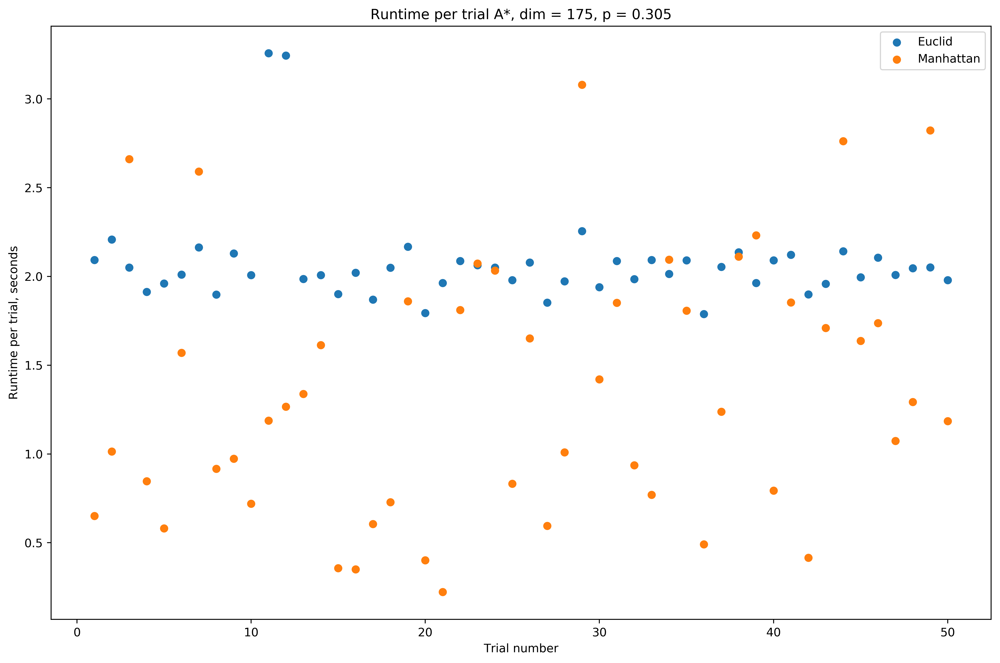

p = 0.355



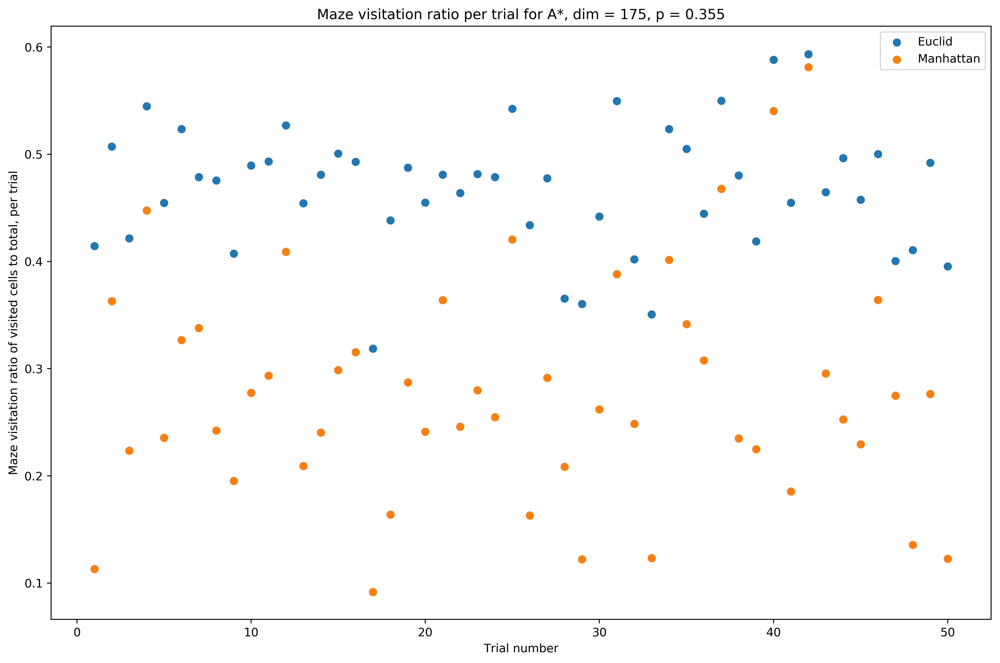

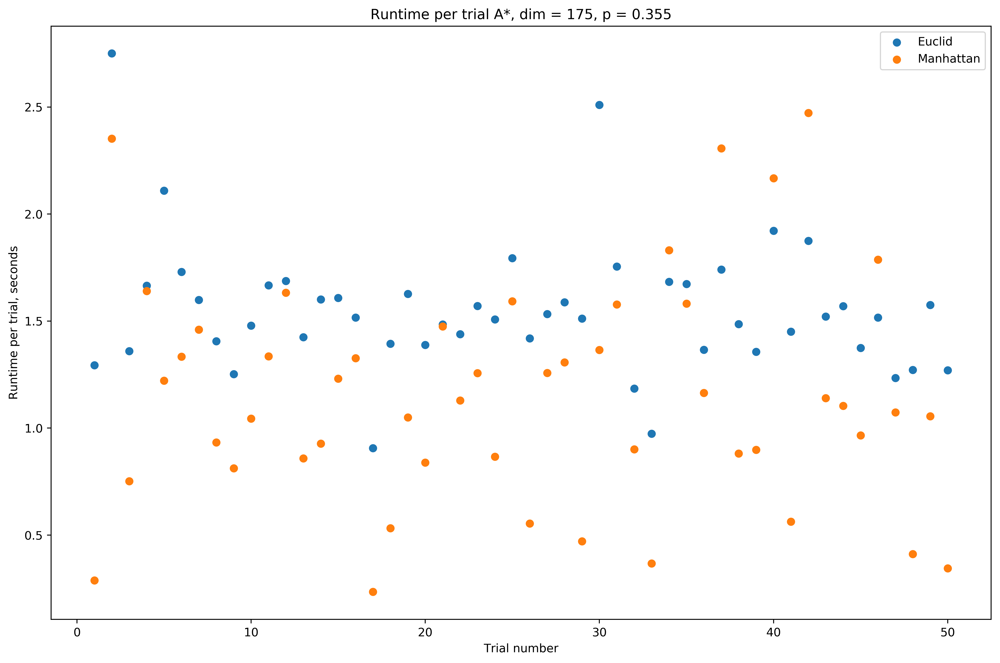

In [8]:
p_range = [p_0 - 0.05, p_0, p_0 + 0.05]
success_sample_size = 50
x_range = [x+1 for x in range(50)]

for p in p_range:
    print('p = {}\n'.format(p))
    visits_euc = []
    visits_man = []
    times_euc = []
    times_man = []
    for n in range(success_sample_size):
        euc_avg_visits, euc_avg_time, man_avg_visits, man_avg_time = aStarTrialDriver(dim, p, 1)
        visits_euc.append(euc_avg_visits)
        visits_man.append(man_avg_visits)
        times_euc.append(euc_avg_time)
        times_man.append(man_avg_time)
    # make nice DataFrames of it
    visits_df = pd.DataFrame()
    visits_df['euc'] = visits_euc
    visits_df['man'] = visits_man
    times_df = pd.DataFrame()
    times_df['euc'] = times_euc
    times_df['man'] = times_man
    # graph visits v p
    plt.figure(figsize=(12,8), dpi=500)
    plt.scatter(x_range, visits_df['euc'].values)
    plt.scatter(x_range, visits_df['man'].values)
    plt.xlabel('Trial number')
    plt.ylabel('Maze visitation ratio of visited cells to total, per trial')
    plt.title('Maze visitation ratio per trial for A*, dim = {}, p = {}'.format(dim, p))
    plt.legend(['Euclid', 'Manhattan'])
    plt.tight_layout()
    plt.show()
    # graph runtime v p
    plt.figure(figsize=(12,8), dpi=500)
    plt.scatter(x_range, times_df['euc'].values)
    plt.scatter(x_range, times_df['man'].values)
    plt.xlabel('Trial number')
    plt.ylabel('Runtime per trial, seconds')
    plt.title('Runtime per trial A*, dim = {}, p = {}'.format(dim, p))
    plt.legend(['Euclid', 'Manhattan'])
    plt.tight_layout()
    plt.show()

Here we see that for every single trial (regardless of $p$), the Manhattan distance heuristic consistently yields a lower visitation ratio than the Euclidean distance heuristic.

Runtime is less unambiguous, where for higher $p$, the Manhattan distance heuristic more clearly yields lower runtimes than the Euclidean distance heuristic does. But for lower $p$, this advantage is less obvious.

If we consider optimality in terms of the visitation ratio, the **Manhattan distance heuristic** is uniformly better than the **Euclidean distance heuristic** for maze solving. This may be because it is closer to the reality of the maze-solving problem. The Euclidean distance is the shortest distance possible in terms of $(x,y)$ coordinates, but any given path must travel rectilinearly, i.e. in some 'Manhattan'-style line of only up, down, left, or right turns. Therefore, the Manhattan distance heuristic informs the algorithm such that it does not underestimate remaining paths as much as it would with the Euclidean distance heuristic.

### Expected algorithm behavior

These algorithms compile and run, but we wish to ensure that each algorithm exhibits proper behavior with respect to its best and worst-case scenarios.

We explore how each algorithm performs for various mazes, in terms of metrics like length of solution path (i.e. is it a *shortest* path?) and number of total visited nodes.

In [9]:
from SampleMazes import *

Observe the following sample 50 by 50 maze:

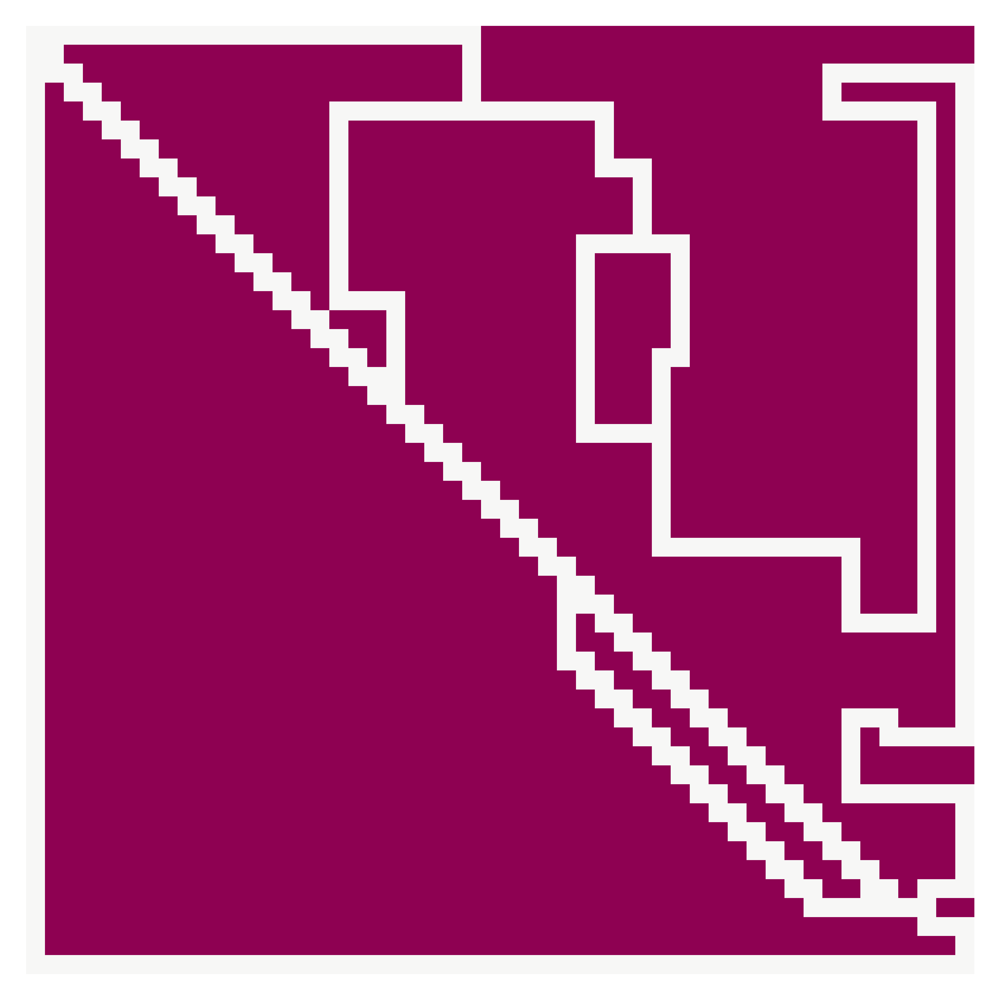

In [10]:
spMz = generateSPTest()
printMazeHM(spMz)

Here there are multiple solution paths - at least five of them. However, there are only two *shortest* paths, which are:

1. The L-shaped path going down the left side, hitting the bottom, turning right, and heading straight for the goal.
2. The diagonal path from source to goal.

We show that the algorithms behave as expected.

#### DFS

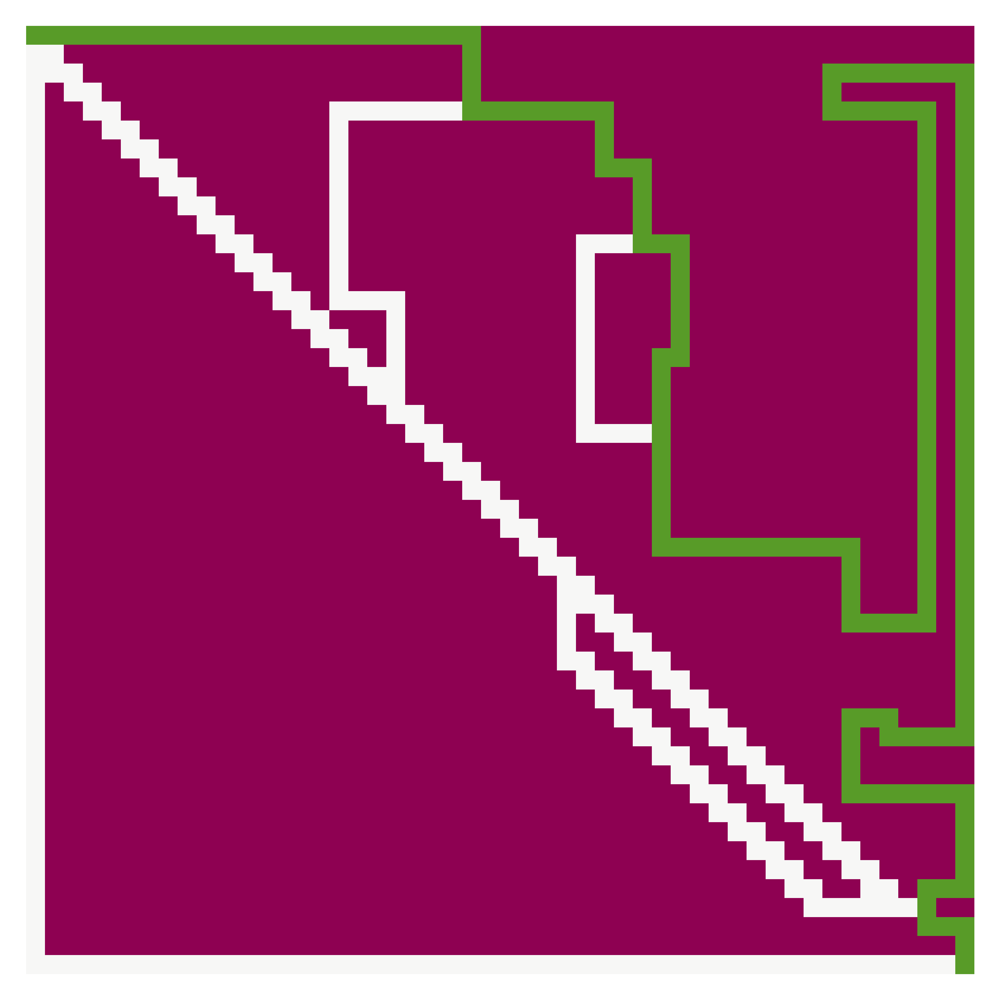

In [11]:
res, path = DFS(deepcopy(spMz))
printMazeHM(res)

**Shortest paths:** As expected, DFS is not guaranteed to take the shortest path. In this example, DFS actually took the longest possible path, solely because the source's right neighbor was visited before its bottom neighbor. The implications of the DFS fringe loading sequence is explored in the next section.

**Visited nodes:** Although DFS visited more nodes along the longer solution path, it did not visit any extraneous nodes that were not on the solution path. However, this is not always the case. As a brief aside, consider another sample maze:

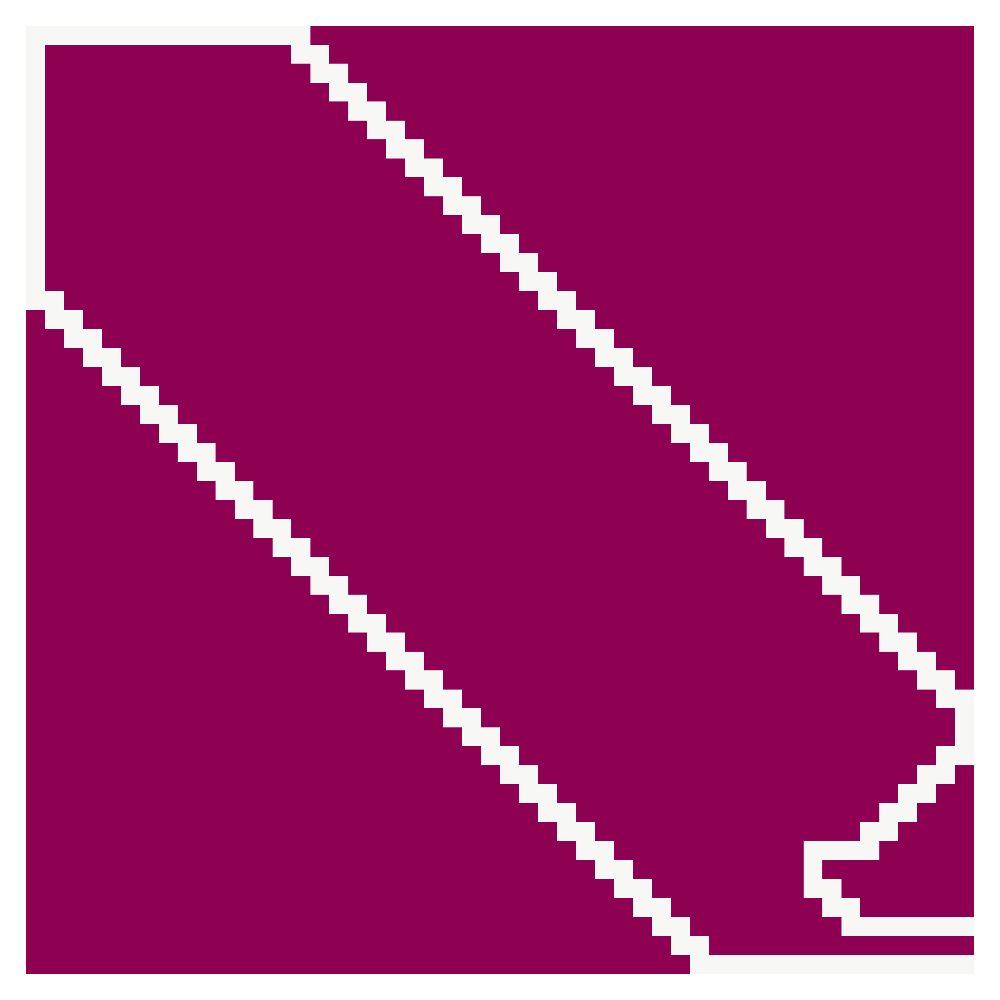

In [12]:
vnMz = generateVNTest()
printMazeHM(vnMz)

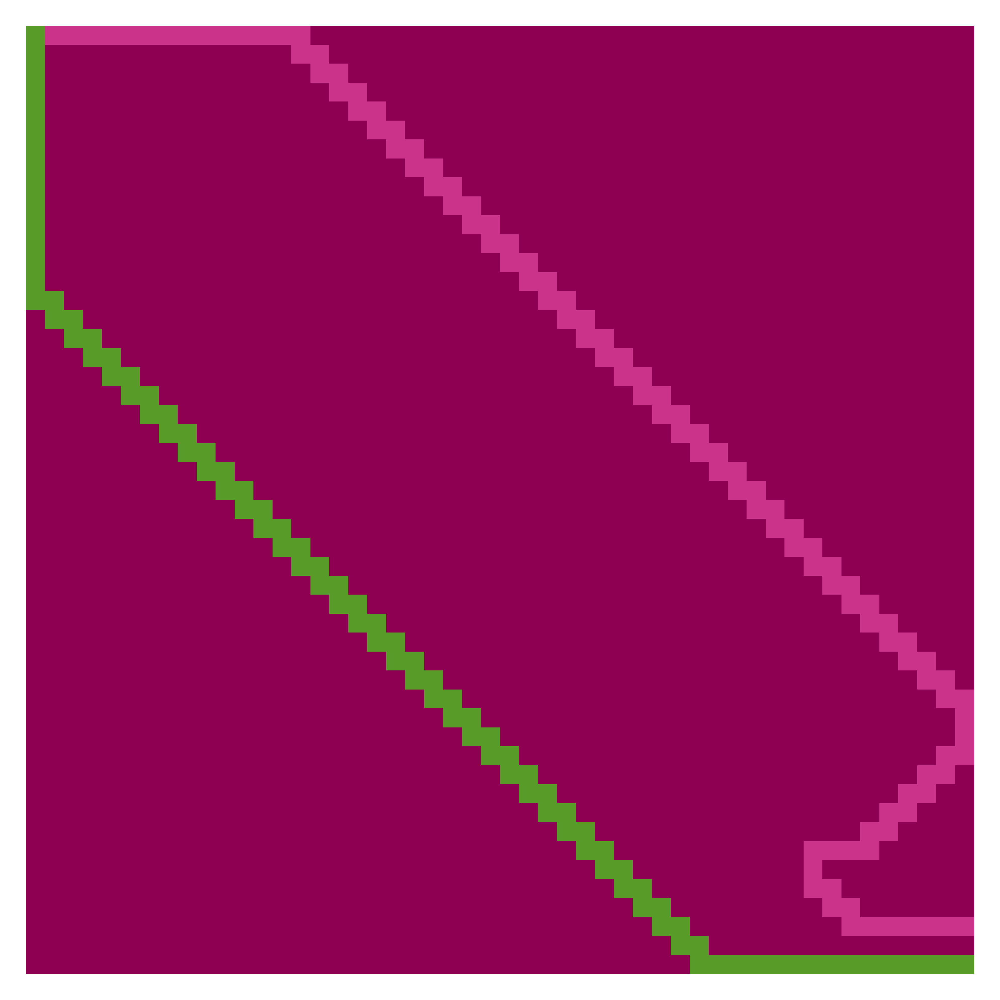

In [13]:
res, path = DFS(deepcopy(vnMz))
printMazeHM(res)

Now, it is apparent that DFS may sometimes explore unnecessary nodes. In this case, DFS explored the upper (pink) path all the way until its eventual failure just atop the goal node. Then, it had to backtrack to the source and explore the lower (green) solution path.

#### BFS

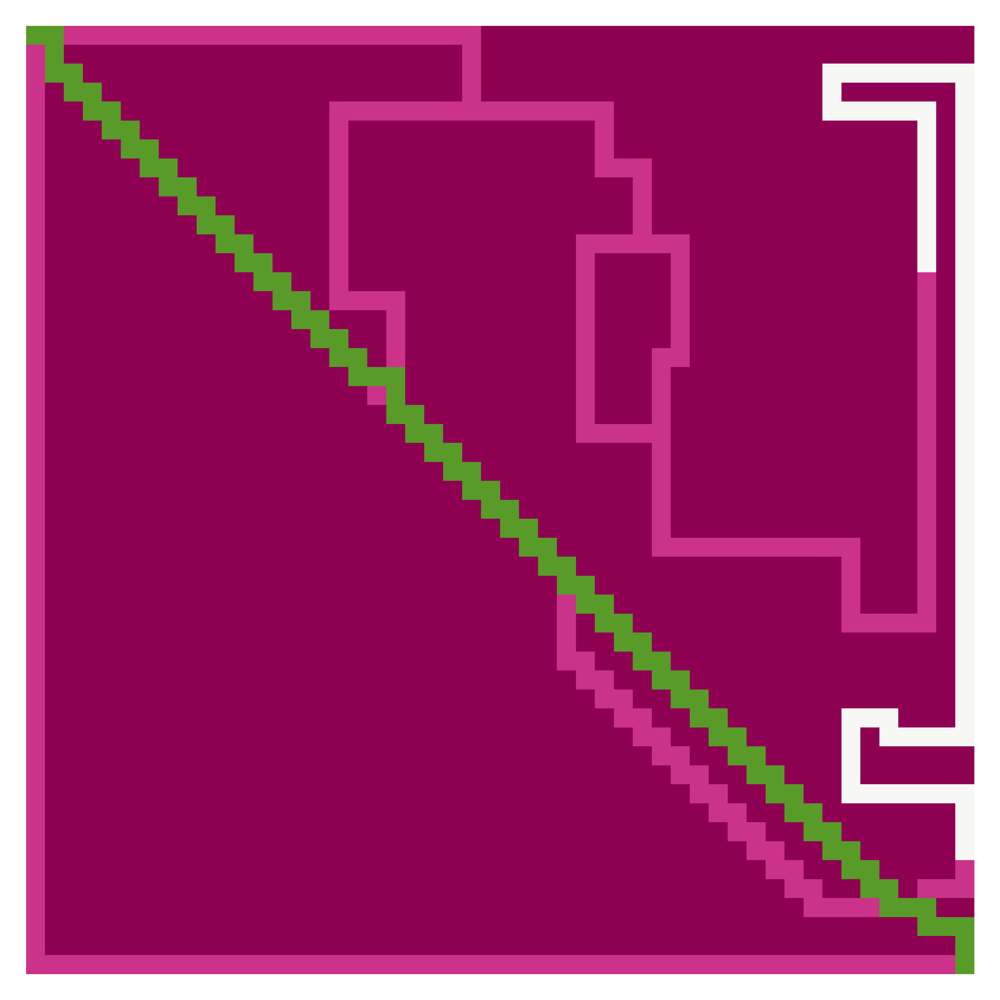

In [14]:
res, path = BFS(deepcopy(spMz))
printMazeHM(res)

In [15]:
len(path)

99

**Shortest paths:** The BFS algorithm returned the shortest path of length 99 that ran straight through the diagonal. 

**Visited nodes:** One can see that the BFS algorithm did in fact visit the bulk of the nodes on the longer solution paths, colored in pink. Because of the breadth-first approach, all of the longer paths were explored until the first solution (green), guaranteed to be the shortest, was found. Therefore, some inefficiency resulted from the algorithm having to check all neighbors of all nodes until a first (and shortest) solution was found.

#### BD-BFS

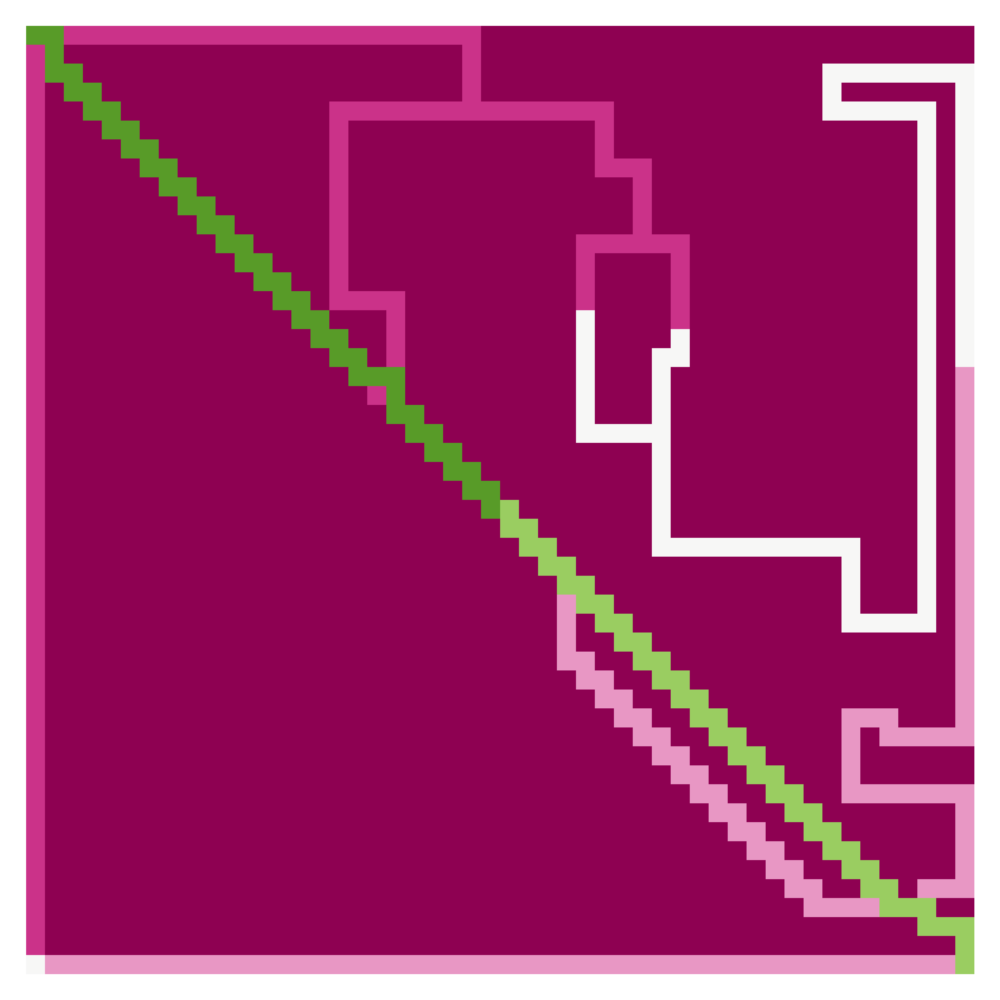

In [16]:
res, path = bdBFS(deepcopy(spMz))
printMazeHM(res)

In [17]:
len(path)

99

**Shortest paths:** Similarly to regular BFS, BD-BFS found the shortest path along the maze diagonal.

**Visited nodes:** In contrast to regular BFS, we see that BD-BFS visited far fewer nodes in the upper right-hand region of the maze. These nodes, along an obnoxiously long solution path, were not visited because of the algorithm's bi-directionality. There are really two searches occuring at once - one from the source-down, and one from the target-up. The target-up path explores several branches from the goal node, including one along the longest possible path. However, it (in light green) meets the source-down search (in dark green) along the shortest diagonal path faster than any other pink branches can meet.

That is, because the algorithm is leveraging the fact that it knows where the goal node is, it can avoid more costly visitations along other branches.

#### A*

A* (Euclid)


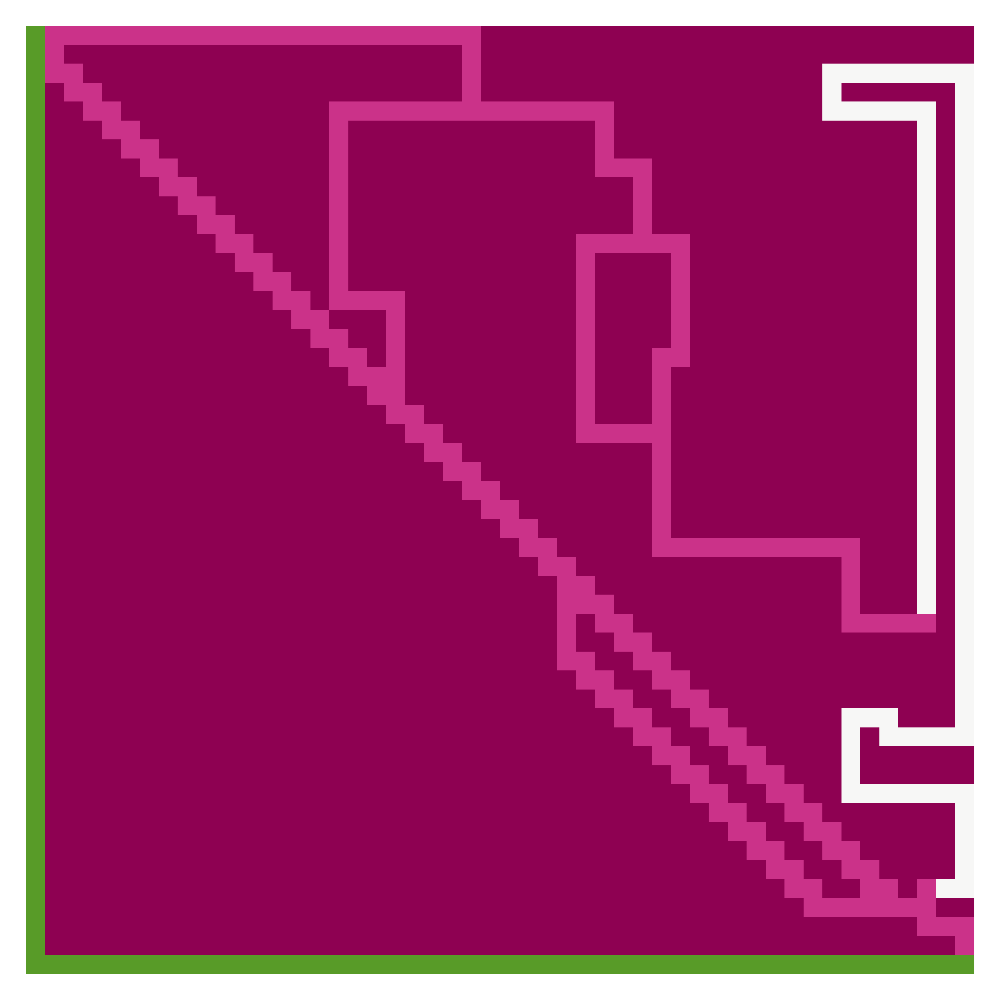

99 

A* (Manhattan)


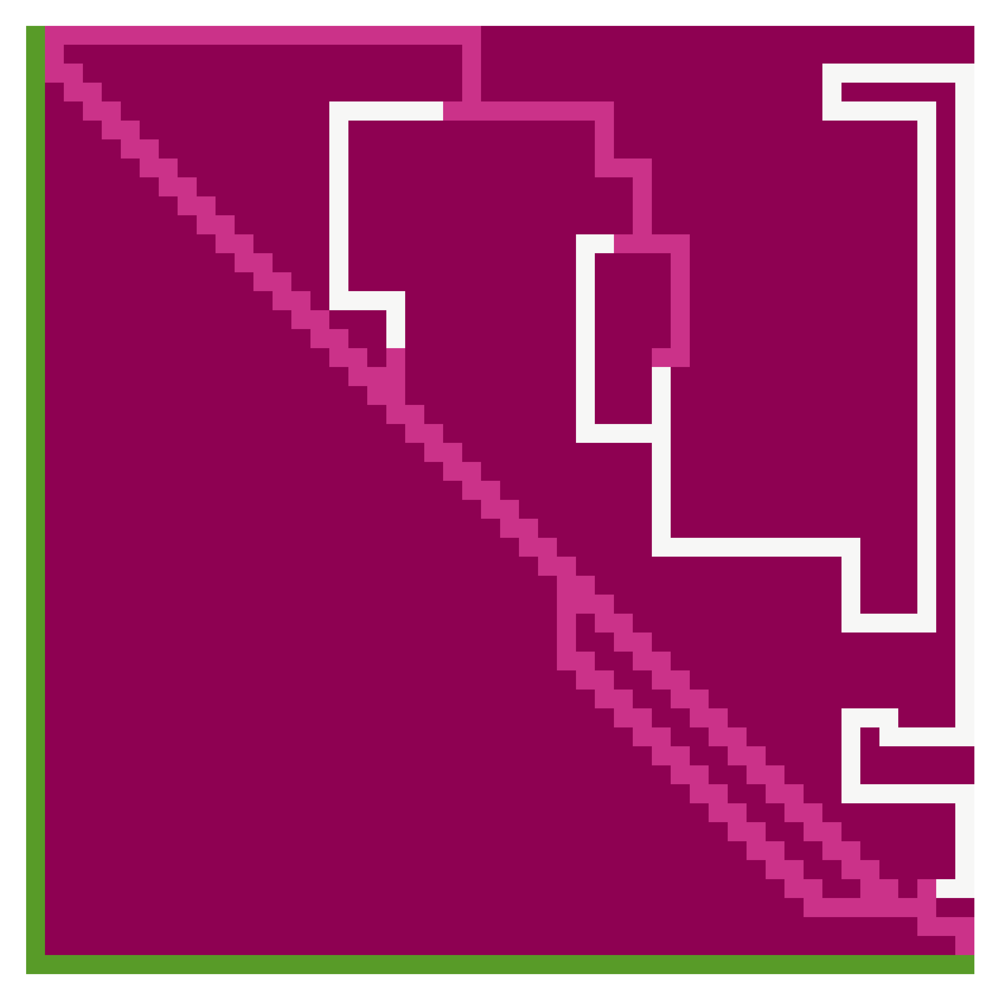

99 



In [18]:
print('A* (Euclid)')
res, path = A_star(deepcopy(spMz), dist_euclid)
printMazeHM(res)
print(len(path), '\n')

print('A* (Manhattan)')
res, path = A_star(deepcopy(spMz), dist_manhattan)
printMazeHM(res)
print(len(path), '\n')

**Shortest paths:** Both A* algorithms found a shortest path of length 99. Although it seems like A* found the L-shaped path on the bottom-left of the maze first, we can see how the shortest path along the diagonal was fully explored (for both heuristics) as well. It was just a matter of a few distance units, as per the Euclidean and Manhattan distance heuristics, which distinguished the returned shortest path from its alternative. This may even be due to maze construction.

**Visited nodes:** We can see that both A* heuristic algorithms visit fewer nodes than BD-BFS, BFS, and DFS. This is expected, as A* selects elements off the fringe not based on sequence of fringe loading or visited neighbors but rather based on: total length traveled from source + estimated length remaining to goal. The use of these heuristics and a priority queue to order fringe elements proves useful in this scenario in reducing visited nodes. 

However, just as shown and discussed in the previous section, we see that the Manhattan distance heuristic leads to fewer nodes visited overall. This suggests that, for this domain of maze-solving problems, the Euclidean distance heuristic cannot be admissible, i.e. the Euclidean heuristic overestimates at least one node's remaining distance to goal. 

**Pf:** Assume, on the contrary, that the Euclidean distance heuristic was admissible. Then the Euclidean A* algorithm would be optimal, and it would explore the minimal number of nodes possible. But we have just seen that the Manhattan distance A* algorithm explores fewer nodes in at least one case, i.e. this case. This contradicts the optimality of Euclidean A*. Therefore, the Euclidean distance heuristic must not be admissible for A* in maze solving problems. Q.E.D.

**Note:** By this logic, it may or may not be true that the Manhattan distance heuristic is admissible.

### Improving DFS via fringe tweaks

In DFS, the order of which neighboring nodes are loaded onto a fringe matters in the sense that the more recent nodes will be explored and backtracked to first. That is, suppose a node $X(i,j)$ has valid neighbors $N_R(i,j+1), N_L(i,j-1), N_D(i+1, j), N_U(i-1,j)$, where R, L, D, and U correspond to moving right, left, down, and up one cell. These neighbors loaded into the fringe in that order. Then, the algorithm will select $N_R$ and expand as deep as possible along that line, before possibly backtracking back to $N_L$ and repeating, back to $N_D$ and repeating, etc. 

However, loading ${N_R, N_L, N_D, N_U}$ in any other sequence would lead to different visitation sequences. This sequence of visited neighbors is not trivial, because suppose exploring $N_D$ leads to the goal node first whereas exploring $N_R, N_L, N_U$ lead to failures and backtracking. If $N_D$ is loaded onto the fringe first, then the algorithm will reach the goal node faster. The idea is that some directions are more beneficial than others.

One way to exploit this is to recognize that in order to reach the goal node from the start node in our maze runner game, the path will, in terms of net change in $(x,y)$ position, go down and to the right. Of course, sometimes a path will have to go up or left in order to circumvent some wall. This assumption is a generality which, although not true for every single node considered, is true in general of any successful path, since the goal is down and to the right of the start.

Hence, we can assume that as a whole, neighbors $N_D, N_R$ will provide more maze-solving utility than neighbors $N_U, N_L$, because those neighbors are closer to the goal, so we ought to load $N_D, N_R$ onto the fringe first.

First, we show that our current algorithm, which considers neighbors in the sequence $(N_R, N_D, N_U, N_L)$ has lower average runtimes than one which considers neighbors in the reversed sequence ($N_L, N_U, N_D, N_R$). The order of $N_R, N_D$ is trivial, so long as they are ahead of $N_U, N_L$.

We use a driver method `dfsTrialDriver(dim, p, n)` which runs $n = 50$ trials of two versions of DFS running on the same maze per trial, and returns average runtime per trial for each. This driver calls the following methods:

1. The same `DFS(maze)` function as used above, which considers neighbors in the order $(N_R, N_D, N_U, N_L)$.
2. The `DFS_leftUp(maze)` function, which considers neighbors in the reversed order ($N_L, N_U, N_D, N_R$).

**Note:** Unlike the analysis of A* in which only successes were considered, failures matter here because the order of the neighbors in the fringe is intimately related to backtracking (in case of failed explorations). So here, we consider average runtime for both successes and failures.

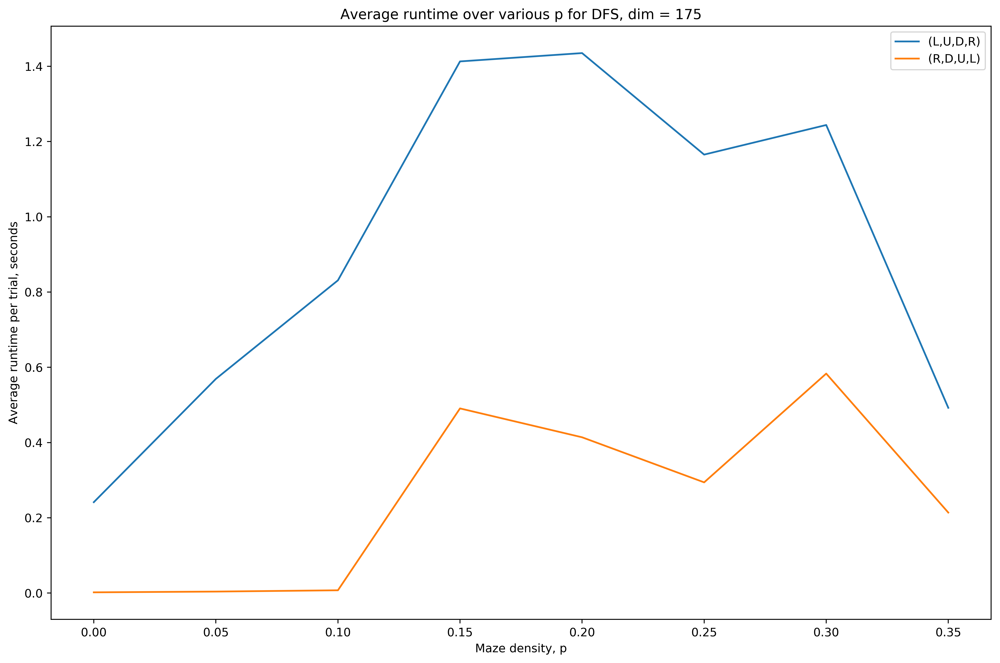

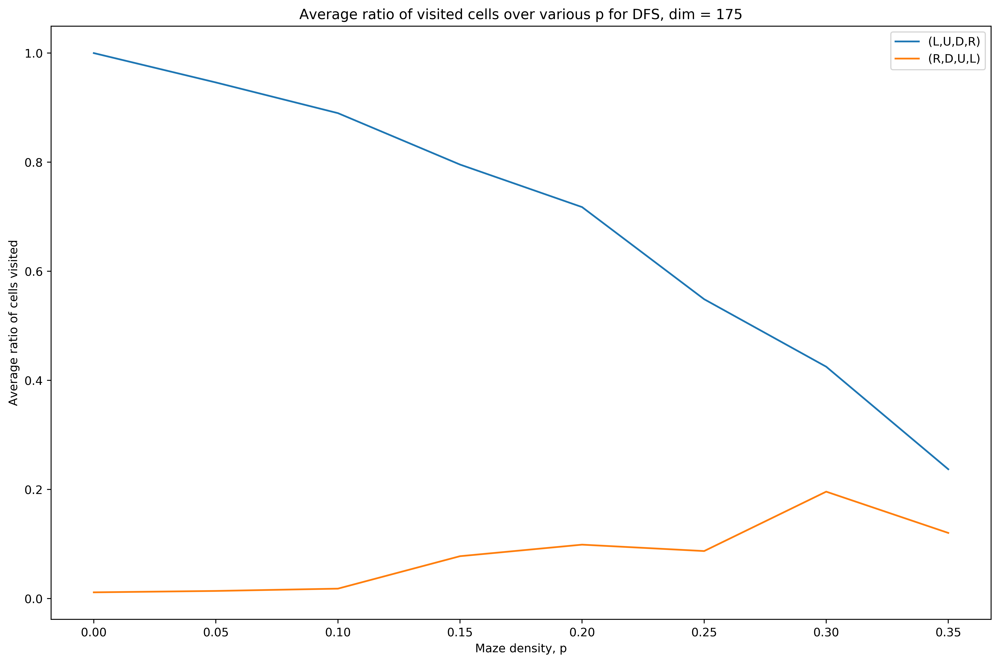

In [19]:
p_range = [round(p,2) for p in np.arange(0, p_0+0.05, 0.05)]
n = 50
times_RD = []
times_LU = []
visited_RD = []
visited_LU = []
for p in p_range:
    rd_avgTime, lu_avgTime, rd_avg_visited, lu_avg_visited = dfsTrialDriver(dim, p, n)
    times_RD.append(rd_avgTime)
    times_LU.append(lu_avgTime)
    visited_RD.append(rd_avg_visited)
    visited_LU.append(lu_avg_visited)
# Make nice DataFrames
DFStimes_df = pd.DataFrame()
DFStimes_df['RD'] = times_RD
DFStimes_df['LU'] = times_LU
DFStimes_df.index = ['p = {}'.format(p) for p in p_range]
DFSvisits_df = pd.DataFrame()
DFSvisits_df['RD'] = visited_RD
DFSvisits_df['LU'] = visited_LU
# graph runtime v p
plt.figure(figsize=(12,8), dpi=500)
plt.plot(p_range, DFStimes_df['LU'].values)
plt.plot(p_range, DFStimes_df['RD'].values)
plt.xlabel('Maze density, p')
plt.ylabel('Average runtime per trial, seconds')
plt.title('Average runtime over various p for DFS, dim = {}'.format(dim))
plt.legend(['(L,U,D,R)', '(R,D,U,L)'])
plt.tight_layout()
plt.show()
# graph visits v p
plt.figure(figsize=(12,8), dpi=500)
plt.plot(p_range, DFSvisits_df['LU'].values)
plt.plot(p_range, DFSvisits_df['RD'].values)
plt.xlabel('Maze density, p')
plt.ylabel('Average ratio of cells visited')
plt.title('Average ratio of visited cells over various p for DFS, dim = {}'.format(dim))
plt.legend(['(L,U,D,R)', '(R,D,U,L)'])
plt.tight_layout()
plt.show()

From above, we have shown that considering neighbors in the sequence $(N_R, N_D, N_U, N_L)$ yields a lower runtime and ratio of average cells visited per maze than considering neighbors in the sequence $N_L, N_U, N_D, N_R$).

In other words, visiting neighbors down or to the right before visiting neighbors left and up reduced runtime and the total number of visited cells.

Interestingly, it appears that for $p > p_0$, the ratio of visited cells for both RD-first and LU-first DFS would decrease and converge. This is likely because maze solvability decreases dramatically for $p > p_0$.

### Visitation habits of BD-BFS and A*

For a given map, BD-BFS and A* both visit many nodes in order to reach a solution. We wish to see if BD-BFS expands nodes which A* does not. 

Consider the following example maze:

In [23]:
mz = generateMaze(dim, p_0)
printMazeHM(mz)

The above maze is solvable. We proceed with running BD-BFS and A* (both Euclidean and Manhattan distance heuristics).

In [24]:
mz1 = deepcopy(mz)
mz2 = deepcopy(mz)
mz3 = deepcopy(mz)

print('BD-BFS')
bdBFS_res, bdBFS_path = bdBFS(mz1)
printMazeHM(bdBFS_res)

print('A* - Euclid')
AEuc_res, AEuc_path = A_star(mz2, dist_euclid)
printMazeHM(AEuc_res)

print('A* - Manhattan')
AMan_res, AMan_path = A_star(mz3, dist_manhattan)
printMazeHM(AMan_res)

BD-BFS


A* - Euclid


A* - Manhattan


As seen above, there are nodes that BD-BFS expands that A* does not (and vice versa).

Observe the white spaces above, which denote unvisited nodes. For BD-BFS, there are stretches of unvisited nodes from the top right to the bottom left of the map, including a strip along those two vertices. These nodes are visited by both A* algorithms. 

On the other hand, A* does not visit nodes further along the bottom left of the map which BD-BFS does. Compare A* - Manhattan to BD-BFS: A* - Manhattan has many unvisited nodes on the bottom left corners which BD-BFS does in fact visit.

This is because BD-BFS expands in all directions based on the fact that it must visit all neighbors of a given current node. It does not visit neighbors in any particular order; in fact it must visit all of them. Consequently, the produced solution maze explores all neighbors from the source and from the target (bi-directionality), both of which are visualized excellently as "meeting" at the middle when the paths cross.

On the other hand, A* will selectively visit neighbors in one direction based on which one has the lowest estimated cost. This is where the Euclidean and Manhattan distance heursitics come into play: the heuristics "inform" the algorithm to choose certain paths to minimize the remaining blocks it needs to visit to reach the goal. 

As seen above, these heuristics are beneficial in ordering the fringe in the sense that the A* paths appear to visit fewer nodes. This is especially true of A* using the **Manhattan distance heuristic**, which ultimately visits the fewest nodes of the three algorithms to reach the goal node.

## Finding the Hardest Maze

Having developed and analyzed our algorithms to solve static mazes, we now turn our attention towards algorithms which seek to generate harder mazes. A 'hard' maze can be considered a solvable maze which has a sufficient scoring for some metric, e.g. length of shortest path, total number of expanded nodes, and maximum size of fringe. 

We seek to find the hardest maze for the following **search algorithms and hardness metrics:**

1. **DFS** with *Maximal Fringe Size*
2. **A* - Manhattan** with *Maximal Nodes Expanded*

For each of these, we try out two **local search algorithms** which both start out with a randomly generated maze, attempt to make it harder, and, if successful, repeat improving the maze's hardness until a certain termination condition is met.

The algorithms are:

#### Simulated Annealing (SA)

SA takes in an initial, solvable maze, and considers every node along the solution path. For each considered path node, it switches it to a BLOCKED wall node and re-runs the search to see if the hardness improves. If the hardness does not improve by flipping this path node, the flip is reverted and the next path node is considered. If the hardness *does* improve, then SA continues with this new path and maze.

This process repeats until a local optima is reached in the sense that for this hard maze's solution path, obstructing any path node will not improve the maze's hardness. 

Additionally, SA attempts to avoid getting 'stuck' in two ways:

1. If blocking a path node leads to an unsolvable maze, then we unblock that path node, but also unblock neighboring walls, if they exist. Do this probabilistically, i.e. only unblock neighboring walls with a certain probability $p_x$. The intuition here is that if we cannot make the maze harder by blocking a certain path node, then perhaps the maze would be harder if we gave it more options to explore beyond this path node, i.e. to neighboring cells which used to be walls but are now open for exploration. This gives the searcher a 'push' to explore other paths which are potentially more challenging.

2. The SA algorithm may terminate with a maze which cannot be made harder by blocking off its path nodes, but this maze may still not the hardest possible maze. To address this, we allow the SA algorithm to probabilistically make 'mistakes' whereby it, with some probability $p_y$, may continue with a resultant maze which is not harder than that of the current iteration. Ideally, the SA algorithm will then avoid getting stuck in a given local optima and continue to harder local optima.

Both $p_x$ and $p_y$ above, which determine probability of unblocking neighboring walls or making 'mistakes', are defined by the same simple exponential decay model:

$$ P = C * e^{-t} $$

where $P$ is the resulting probability, $C$ is some fixed threshold (set to 0.25 in our implementation), and $t$ is total time elapsed from start.

Because this decay model determines the probability of avoiding stoppages, and this probability tends towards $0$ as $t \to \infty$, so the algorithm will get 'stuck' eventually and terminate over time.

*See `SimulatedAnnealing.py` for more implmentation details.*

#### Beam Search (BS)

Instead of considering one 'child' node (i.e. a more difficult path via blocking path nodes) at a time, BS runs a certain number $k$ of climbers which generate child mazes. 

To accomplish this, we utilize a fringe of tuples which contain the following elements:

1. A maze
2. A hardness metric value: either max fringe size or max nodes expanded
3. A solution path

$k$ solvable mazes (and their metadata) are randomly generated and loaded into the fringe. These randomly generated mazes have metrics which serve as a baseline for future iterations' metrics; ideally, we expect to see those hardness metrics increasing over multiple iterations. 

Additionally, we use those mazes' initial solution paths to construct subsequent fringes over subsequent iterations of BS. For a given maze in the fringe, we consider a random sample of nodes in its existing solution path, and then we look at those nodes' neighboring walls, if they exist. Then, we unblock those nodes and re-run the search algorithm on the resulting maze. Like in SA, the intuition here is to try to force the runner on different and potentially more difficult paths which jut off the solution path. 

If we were to not use a random sample of nodes in the existing solution path, and consider all of them, the algorithm's runtime would blow up faster than our machines could handle - on the order of days, rather than hours. Hence, random sampling is used here to produce results in reasonable time: read more about runtime considerations below.

From here, we see if the resulting maze has a higher hardness metric value, and if so, we add it to the new fringe for this iteration. Then, we take the $k$ hardest resulting mazes and repeat for the next iteration.

Beam Search will terminate if either:

1. The number of total iterations is fixed, or the program is artificially terminated by the user.
2. A local optima is reached, i.e. the maze is blocked off as much as possible.

*See `BeamSearch.py` for more implementation details.*

#### Design Considerations

##### Algorithm choices

We choose these local search algorithms primarily because they are relatively simple in terms of execution. They both focus on a given maze's solution path, and try to make the maze harder by obstructing that path or diverting a solution away from it.

We also considered implementing some type of genetic local search algorithm, but we found it difficult to conceptualize how to create offspring mazes from two or more parent mazes - simply splicing halves did not make sense.

##### Advantages 

Our SA and BS implementations aim to exploit that to make a maze 'harder' in terms of max fringe size or max nodes expanded, one would want to obstruct a searcher away from the goal in as elaborate a manner as possible. Consider a runner which runs almost all the way to the goal, and then runs away from it in several layers of spirals throuhgout the maze before having to backtrack to a correct path to the goal. In this case, the stack grows very large and may include the majority of the nodes in the maze. By diverting the solution path and potentially forcing the runner into superfluous paths via opening walls, the runner is more apt to run into these wasteful spirals.

##### Problems of luck

In a sense, because we are dealing with randomly generated (albeit solvable) mazes, the success of these local search algorithms depends on luck insofar as certain mazes are more prone to the hardness manipulations detailed above. 

By this, we mean that some mazes will have walls such that diversions off the solution path will take longer before failing and backtracking. For other initial mazes, these diversions will not be as effective; they could continually bump into walls, backtrack, and repeat again, instead of going down long fruitless paths.

##### Problems of scalability

In general, working on the state space of multiple *mazes* rather than just maze cells produces practical computational problems. These algorithms computationally intensive - performing heap operations on the fringe, blocking and testing every path node, and unblocking and testing many path-adjacent walls are not trivial operations. As such, when mazes are of sizes $50 \times 50$ and beyond, solution paths become longer, the fringe of mazes becomes larger, and there are more path-adjacent walls to test. Runtime - which is already to the order of several hours for small $(\leq50 \times 50)$ mazes - grows exponentially as the mazes scale up.


Noting this, we start by testing our local search algorithms on **DFS** with *Maximal Fringe Size.* We show ideal trials, i.e. trials which increased hardness exceptionally well, as well as discuss typical local search algorithm behavior.

We use $dim = 175$ as above, but we use $p = 0.2$ for performance reasons. For higher $p$, like $p_0 = 0.305$ from above, both algorithms led to many mazes which could not be solved.

### Hardest maze using DFS, w.r.t. maximal fringe size

#### Simulated Annealing

The following is the result of simulated annealing running with DFS on a maze with $dim = 175, p = 0.20$. It is the best of 5 simulated trials.

![SA - DFS](img/SA_DFS_res.png)

The computation took 45 minutes to execute the 5 trials and select the above as the best of 5. The maze's initial solution path had a maximal fringe size of **1,242 nodes**, which was increased in the final result to **6,056 nodes**, a **388 percent improvement in hardness.**

#### Beam Search

The following is the result of beam search running with DFS on a maze with $dim = 175, p = 0.20$. It used $k = 20$ climbers and randomly chose 10 walls to unblock near the path.

![BS - DFS](img/BS_DFS_res.png)

The computation took approximately 3 hours with 20 iterations of BS. The maze's initial solution path had a maximal fringe size of **2,152 nodes,** and the final maze's solution path had a maximal fringe size of **14,235 nodes,** a **561 percent improvement in hardness.**

#### The Verdict

The resulting maze paths from both SA and BS appear to hug the upper and right edges of the maze, but they in fact are constantly dipping deep into the pink sections, failing, and backtracking back to the edges. Therefore, the above mazes make DFS do more 'work' in terms of exploring many fruitless paths, as intended.

Note that these are somewhat 'lucky' trials in the sense that certain initial mazes are more prone to lending harder mazes (in fewer iterations) than other initial mazes. BS's initial maze fringe size was larger than that of the one for SA, for example. For other SA trials, computation time exceeded six hours, and never terminated with local optima. For other BS trials, computation time reached over 10 hours of generating mazes and over 100 iterations of BS. It had max fringe sizes which increased steadily from ~2,000 up to >7,000, but it never terminated with a local optima. 

This shows that while some initial mazes lend hard mazes relatively quickly, other initial mazes may take a longer period of steady computations in order to reach a local optima.

It would appear based on these examples (and supported by other trials we had run) that **for DFS, Beam Search produces harder mazes (in terms of max fringe size) at the cost of much higher runtimes.**

### Hardest maze using A* - Manhattan, w.r.t. maximum nodes expanded

#### Simulated Annealing

The following is the result of simulated annealing running with A* (Manhattan distance heuristic) on a maze with $dim = 175, p = 0.20$. It is the best of 5 simulated trials.

![SA - A*](img/SA_AStar_res.png)

The above computations took 2 hours. The maze's initial solution path expanded a maximum of **12,973 nodes,** whereas the final solution path expanded a maximum of **17,212 nodes,** a **33 percent increase in maze hardness.**

#### Beam Search

The following is the result of beam search running with A* (Manhattan distance heuristic) on a maze with $dim = 175, p = 0.20$. It used $k = 20$ climbers, and randomly chose 10 walls to unblock near the path.

![BS - A*](img/BS_AStar_res.png)

The above computations were run for over 24 hours with 150 iterations before being terminated manually. The maze's initial solution path expanded a maximum of **24,605 nodes,** and the final solution path expanded a maximum of **26,372 nodes,** a **7 percent increase in maze hardness.**

#### The Verdict

The two solution paths for SA and BS look very different, yet they are both accomplishing the same goal of diverting the solution path to force the searcher into exploring more nodes.

SA's result looks like a typical A* - Manhattan run which goes roughly along the diagonal, but it expands more nodes to the upper right and the lower left of the solution path than expected. This is a result of SA deliberately forcing the solution path off of the diagonal as much as possible to explore extraneous nodes. This works as intended.

The result of BS looks different in that it takes the L-shaped path in the bottom left, but in reality it appears to be doing a similar thing, possibly in greater magnitude. The BS algorithm managed to push the path far from the naturally diagonal Manhattan distance-based solution all the way into the bottom left corner, while still forcing the searcher to go through nearly the whole maze. In fact, the runner is forced to expand **86 percent** of all possible nodes to reach the solution, which is impressive considering the maze density $p = 0.2$.

Comparing these two results is complicated given they started with different baseline metrics, but it would appear that **for A*, Simulated Annealing strikes a good balance between reasonable runtime and reasonable improvements in hardness.** 

Note that given more powerful computing resources or more time to run, Beam Search would give a slower but steadier increase in hardness until it reached optimal hardness.

## Running Through a Burning Maze

Now, we consider mazes that have the additional feature that a 'fire' starts in the top right corner, can spread throughout the maze, and may 'kill' the runner before it can reach the goal node. The fire will eventually spread to the entire maze if the runner does nothing.

The fire may spread in the following way:

For some $0 \leq q \leq 1$:

1. If a free cell has no burning neighbors, it will not burn in the next time step.
2. If a cell is on fire, it will remain on fire.
3. If a free cell has $k$ burning neighbors, the probability it will burn in the next time step is: $1 - (1-q)^k$.

That is, the higher $q$ is, the faster the fire will spread.

Hence, the runner must both reach the goal node and avoid burned nodes, which, unlike walls, change as time goes on at a rate which depends on $q$.

### Baseline solution: run for your life

The baseline solution is static: pre-calculate the shortest path as if the fire didn't exist, run it with the fire, and either survive or fail. 

We implement this baseline strategy by generating a 'valid fire maze', i.e. the runner can reach the bottom right, and the fire can reach the bottom left, ensuring that it is possible for the runner to go down some path where they will be burned. Then, we run **A* (Manhattan)** on this maze, with the fire simulated at each time step, and see if the runner survives.

*See `Fire.py` for more implementation details.*

We gather data on the runner's survival rates for various $q \in [0.1, 1.0]$, with 100 trials per $q$.

**Note:** For the remainder of this analysis, we use $dim = 50$ and $p = 0.305$ for our search algorithms. A lower $dim$ is used because runtimes appear to increase exponentially with increasing $dim$.

In [1]:
from Fire import *

In [3]:
baseLineData = fireDriver()

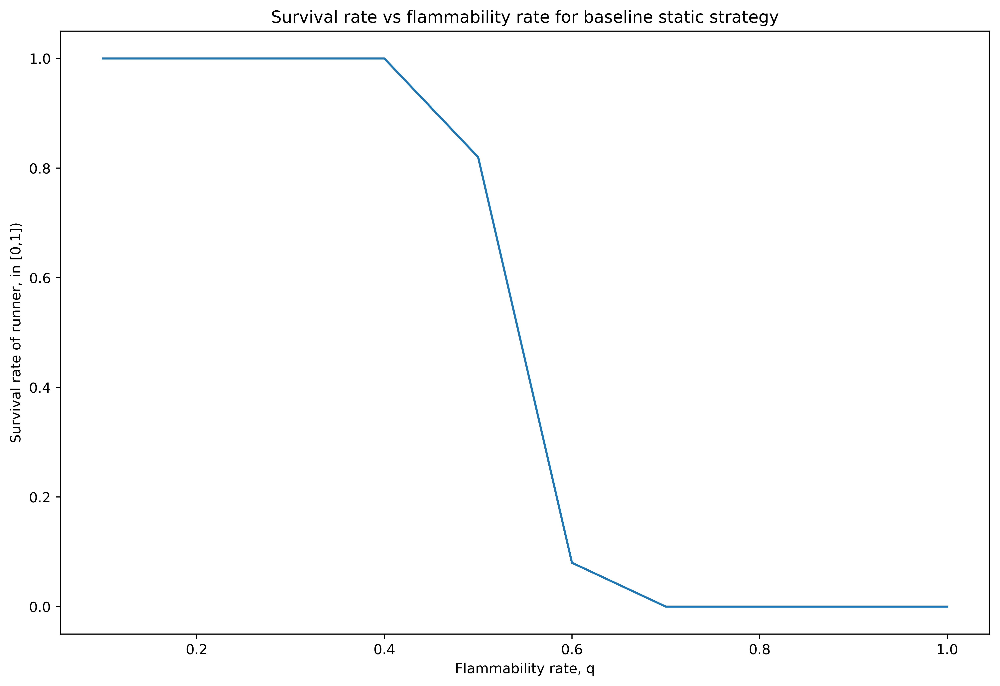

In [17]:
baseLineData_df = pd.DataFrame.from_dict(baseLineData, orient='index')
baseLineData_df.columns=['survival_rate']
baseLineData_df['survival_rate'] = baseLineData_df['survival_rate'] / 100
plt.figure(figsize=(12,8), dpi=500)
plt.plot(baseLineData_df.index, baseLineData_df['survival_rate'].values)
plt.xlabel('Flammability rate, q')
plt.ylabel('Survival rate of runner, in [0,1])')
plt.title('Survival rate vs flammability rate for baseline static strategy')
plt.show()

The above computatations took 1.5 hours to generate 100 trials, calculate shortest paths, and simulate the fire trials. It appears that with the baseline strategy, the runner's survivability drops below 0.5 for $q = 0.55$. 

We seek to develop a maze running strategy which will outperform this baseline strategy, i.e. the runner can survive for more volatile fires with higher $q$.

### Dynamic solution: A* with a smarter heuristic

To solve these dynamic mazes, we seek to develop a solution which is also dynamic in the sense that it recomputes its next move at each time step in response to the fire's spread. That is, we wish to exploit the fact that the maze runner has perfect information of which nodes are on fire at any time step.

From the maze runner's perspective, at each time step, he/she/it has two priorities: 

1. Get closer to the goal node
2. Get further from all fire nodes

Our algorithm adopts both of these priorities into one heuristic, utilized by the A* algorithm as before:

$$h(x) = |P(x)| + D_m(x, G) - W*D_m(x,F)$$

where:

- $h(x)$ is the value of the heuristic function at a given node $x$
- $P(x)$ is the path from start to node $x$, so $|P(x)|$ is the length of that path
- $D_m(x,G)$ is the Manhattan distance from node $x$ to the goal node $G$
- $W$ is some weighting designed to relax the weighting of fire avoidance
- $D_m(x,F)$ is the Manhattan distance from node $x$ to the nearest fire node $F$, i.e. it is the minimum Manhattan distance to the fire

and the algorithm considers neighboring nodes in the sequence: $(N_D, N_R, N_U, N_L)$.



To evaluate the effectiveness of this smarter A*, we need to identify which weighting $W$ to assign.